In [1]:
conda install pytorch torchvision -c pytorch

Solving environment: done

## Package Plan ##

  environment location: /opt/anaconda3

  added / updated specs:
    - pytorch
    - torchvision


The following packages will be downloaded:

    package                    |            build
    ---------------------------|-----------------
    ninja-1.9.0                |   py37h04f5b5a_0          90 KB
    pytorch-1.5.0              |          py3.7_0        34.7 MB  pytorch
    torchvision-0.6.0          |         py37_cpu         5.8 MB  pytorch
    ------------------------------------------------------------
                                           Total:        40.6 MB

The following NEW packages will be INSTALLED:

  ninja              pkgs/main/osx-64::ninja-1.9.0-py37h04f5b5a_0
  pytorch            pytorch/osx-64::pytorch-1.5.0-py3.7_0
  torchvision        pytorch/osx-64::torchvision-0.6.0-py37_cpu



pytorch-1.5.0        | 34.7 MB   | ##################################### | 100% 
torchvision-0.6.0    | 5.8 MB    | ###########

In [1]:
import torch

In [2]:
import torchvision

In [3]:
from torchvision import transforms,datasets

In [4]:
train  = datasets.MNIST("",train = True , download = True,
                       transform = transforms.Compose([transforms.ToTensor()])) 

test   = datasets.MNIST("",train = False , download = True,
                       transform = transforms.Compose([transforms.ToTensor()]))

In [23]:
train

Dataset MNIST
    Number of datapoints: 60000
    Root location: 
    Split: Train
    StandardTransform
Transform: Compose(
               ToTensor()
           )

In [31]:
trainset = torch.utils.data.DataLoader(train, batch_size=10,shuffle = True)
testset  = torch.utils.data.DataLoader(test, batch_size=10 , shuffle = True)

In [24]:
for data in testset:
    X ,y = data
    if y == 9:
        break

    

In [25]:
x, y =data[0][0] , data[1][0]

In [6]:
np.array_split(df, 3)

NameError: name 'np' is not defined

In [9]:
import matplotlib.pyplot as plt

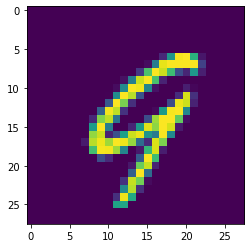

In [26]:
plt.imshow(data[0][0].view(28,28))


In [12]:
total = 0
counter_dict ={0:0, 1:0, 2:0, 3:0, 4:0, 5:0, 6:0, 7:0, 8:0, 9:0,}
for data in trainset:
    xs, ys = data
    for y in ys:
        counter_dict[int(y)] +=1
        total +=1
print(counter_dict)
        

{0: 5923, 1: 6742, 2: 5958, 3: 6131, 4: 5842, 5: 5421, 6: 5918, 7: 6265, 8: 5851, 9: 5949}


In [55]:
total

60000

In [56]:
for i in counter_dict:
    print(f"{i}:{(counter_dict[i]/total*100)}") 

0:9.871666666666666
1:11.236666666666666
2:9.93
3:10.218333333333334
4:9.736666666666666
5:9.035
6:9.863333333333333
7:10.441666666666666
8:9.751666666666667
9:9.915000000000001


In [27]:
import torch.nn as nn
import torch.nn.functional as F

In [32]:
class Net(nn.Module):
    def __init__(self):
        super().__init__()
        self.fc1 = nn.Linear(28*28,64)
        self.fc2 = nn.Linear(64,64)
        self.fc3 = nn.Linear(64,64)
        self.fc4 = nn.Linear(64,10)
        
    def forward(self,x):
        x = F.relu(self.fc1(x))
        x = F.relu(self.fc2(x))
        x = F.relu(self.fc3(x))
        x = self.fc4(x)
        '''h_relu = self.fc1(x).clamp(min=0)
        y_pred = self.fc2(h_relu)
        y_pred = self.fc3(y_pred)
        y_pred = self.fc4(y_pred)'''
        #return y_pred
        #return x
        return F.log_softmax(x,dim = 1)
net = Net()

In [105]:
print(net)

Net(
  (fc1): Linear(in_features=784, out_features=64, bias=True)
  (fc2): Linear(in_features=64, out_features=64, bias=True)
  (fc3): Linear(in_features=64, out_features=64, bias=True)
  (fc4): Linear(in_features=64, out_features=10, bias=True)
)


In [3]:
X =torch.rand(28*28)
X = X.view(-1,28*28)

In [34]:
output = net(data[0][0])

RuntimeError: size mismatch, m1: [28 x 28], m2: [784 x 64] at /Users/distiller/project/conda/conda-bld/pytorch_1587428061935/work/aten/src/TH/generic/THTensorMath.cpp:41

In [33]:

#criterion = torch.nn.MSELoss(reduction='sum')
#optimizer = torch.optim.SGD(net.parameters(), lr=1e-4)
optimiser = torch.optim.Adam(net.parameters(), lr=0.001)

EPOCHS =3
#loss_fn = torch.nn.MSELoss(reduction='sum')
for epoch in range(EPOCHS):
    for data in trainset:
        X, y = data 
        net.zero_grad()
        output = net(X.view(-1,28*28))
        loss = F.nll_loss(output, y)
        #loss = torch.nn.MSELoss(output, y )
        #loss = criterion(output,y)
        #loss = loss_fn(output,y)
        loss.backward()
        optimiser.step()
    print(loss)
        

tensor(0.5022, grad_fn=<NllLossBackward>)
tensor(0.0308, grad_fn=<NllLossBackward>)
tensor(0.0005, grad_fn=<NllLossBackward>)


In [35]:
correct = 0
total = 0
with torch.no_grad():
    for data in testset:
        X,y = data
        output = net(X.view(-1,784))

        for idx , i in enumerate(output):
            if torch.argmax(i) == y[idx]:
                correct+=1
                print(output)
            total +=1 
print(correct/total)

tensor([[-1.4314e+01, -1.8102e-03, -1.2603e+01, -1.3372e+01, -8.9753e+00,
         -1.6081e+01, -9.6399e+00, -1.1178e+01, -6.4524e+00, -1.0779e+01],
        [-4.5846e+00, -1.2057e+01, -1.0591e+01, -9.0476e+00, -7.8874e+00,
         -8.2051e+00, -1.1471e-02, -1.0762e+01, -7.9637e+00, -1.0378e+01],
        [-1.7788e+01, -3.9891e-04, -1.4610e+01, -1.4947e+01, -1.0382e+01,
         -1.8310e+01, -1.3276e+01, -1.2021e+01, -7.9466e+00, -1.2113e+01],
        [-1.6756e+01, -2.4368e+01, -2.5412e+01, -2.3713e+01, -1.6127e+01,
         -1.7872e+01, -1.1921e-07, -2.3815e+01, -1.9774e+01, -2.1848e+01],
        [-2.4576e+01, -2.9839e+01, -2.6313e+01, -1.2889e+01, -2.6261e+01,
         -2.7418e-05, -2.5304e+01, -2.4414e+01, -1.7525e+01, -1.0602e+01],
        [-1.0625e+01, -4.4047e+00, -7.1267e+00, -5.5611e+00, -7.9836e+00,
         -8.5910e+00, -1.6014e+01, -5.7127e-02, -8.3514e+00, -3.2736e+00],
        [-1.5411e+01, -2.2810e+01, -2.2016e+01, -2.0620e+01, -1.5638e+01,
         -1.5309e+01, -7.1526e-0

tensor([[-2.6770e+01, -2.8610e-06, -1.6410e+01, -1.8089e+01, -1.3535e+01,
         -2.3001e+01, -1.8539e+01, -1.5344e+01, -1.3649e+01, -1.8622e+01],
        [-1.4169e+01, -1.8708e+01, -1.3010e+01, -7.3055e+00, -1.9093e+01,
         -1.0207e+01, -1.5941e+01, -1.7979e+01, -7.7051e-04, -9.7488e+00],
        [-8.2797e+00, -1.0455e+01, -1.0272e+01, -1.2440e+01, -1.5582e+01,
         -1.1703e+01, -1.0587e+01, -1.4557e+01, -3.5578e-04, -1.4083e+01],
        [-1.8582e+01, -8.7711e-04, -1.0199e+01, -1.4397e+01, -1.2633e+01,
         -1.8142e+01, -1.4782e+01, -1.0293e+01, -7.1293e+00, -1.5479e+01],
        [-2.2464e+01, -1.4222e+01, -1.2078e+01, -3.6120e-05, -2.3093e+01,
         -1.2650e+01, -3.1375e+01, -1.1715e+01, -1.2901e+01, -1.1050e+01],
        [-1.4809e+01, -9.6631e+00, -2.7998e-04, -9.7583e+00, -1.7250e+01,
         -1.8846e+01, -1.5822e+01, -9.0053e+00, -1.0251e+01, -2.5505e+01],
        [-1.6701e+01, -1.7662e+01, -1.9198e+01, -1.9379e+01, -1.3196e+01,
         -1.4017e+01, -3.2186e-0

tensor([[-1.6296e+01, -1.4516e+01, -1.8385e+01, -1.1166e+01, -9.9459e+00,
         -1.3508e+01, -2.3208e+01, -1.0678e+01, -1.3853e+01, -8.7973e-05],
        [-2.7988e+01, -3.5508e+01, -3.0022e+01, -1.5483e+01, -2.9239e+01,
         -5.1260e-06, -2.8848e+01, -2.8561e+01, -1.8649e+01, -1.2230e+01],
        [-2.3996e+01, -1.2636e-05, -1.3803e+01, -1.6366e+01, -1.3858e+01,
         -2.0645e+01, -1.6275e+01, -1.3886e+01, -1.1559e+01, -1.8273e+01],
        [-7.0134e+00, -6.5952e+00, -9.7421e-03, -6.1923e+00, -8.5422e+00,
         -6.3120e+00, -6.7548e+00, -8.6385e+00, -6.2090e+00, -1.0825e+01],
        [-2.8409e+01, -1.7429e+01, -1.5674e+01, -3.3616e-05, -2.9413e+01,
         -1.0306e+01, -3.8067e+01, -2.1802e+01, -2.0223e+01, -1.6980e+01],
        [-1.6002e+01, -2.0481e+01, -1.5349e+01, -1.0169e+01, -1.9899e+01,
         -1.1668e+01, -1.5370e+01, -1.9918e+01, -5.7338e-05, -1.1539e+01],
        [-1.2639e+01, -1.4383e+01, -1.6691e+01, -1.6264e+01, -1.1651e+01,
         -6.9285e+00, -1.0531e-0

tensor([[-1.3429e+01, -1.8117e+01, -1.4030e+01, -1.1851e+01, -1.9599e+01,
         -1.2017e+01, -1.4372e+01, -1.9167e+01, -1.8120e-05, -1.3097e+01],
        [-2.2829e+01, -1.7820e+01, -2.5034e-06, -1.3082e+01, -1.6411e+01,
         -1.9952e+01, -1.5445e+01, -2.0242e+01, -1.6640e+01, -3.1141e+01],
        [-6.3523e+00, -3.5819e+00, -1.3977e+00, -2.6945e+00, -9.1768e+00,
         -7.8224e+00, -1.1541e+01, -1.4475e+00, -8.7793e-01, -5.4326e+00],
        [-8.8793e+00, -9.5544e+00, -6.2783e+00, -5.1989e+00, -1.3160e+01,
         -8.6115e+00, -1.1733e+01, -9.9493e+00, -8.0179e-03, -8.8974e+00],
        [-1.9884e+01, -3.8623e-05, -1.4022e+01, -1.6702e+01, -1.1406e+01,
         -2.1688e+01, -1.3919e+01, -1.4332e+01, -1.0591e+01, -1.6736e+01],
        [-1.5900e+01, -2.0259e+01, -1.4693e+01, -7.2755e+00, -1.7659e+01,
         -8.1738e+00, -1.6241e+01, -1.8891e+01, -3.5720e-03, -5.9559e+00],
        [-2.9303e+01, -1.3113e-06, -1.7094e+01, -2.2198e+01, -1.4310e+01,
         -2.7212e+01, -1.7134e+0

tensor([[-2.1524e+01, -2.6703e-05, -1.4034e+01, -1.7210e+01, -1.2197e+01,
         -2.2097e+01, -1.5687e+01, -1.4337e+01, -1.0814e+01, -1.7578e+01],
        [-1.4761e+01, -1.5713e+01, -1.4201e+01, -7.7258e+00, -1.3575e+01,
         -1.0107e-03, -1.3483e+01, -1.4698e+01, -1.0108e+01, -7.5542e+00],
        [-1.5893e-03, -1.6997e+01, -1.1180e+01, -1.2358e+01, -8.6652e+00,
         -1.1687e+01, -7.7745e+00, -1.0552e+01, -1.2702e+01, -6.9703e+00],
        [-1.4693e+01, -2.0768e+01, -1.7829e+01, -1.7588e+01, -2.1534e+01,
         -1.2833e+01, -1.2435e+01, -2.2348e+01, -6.9141e-06, -1.6708e+01],
        [-9.0966e+00, -8.8589e+00, -1.2394e+01, -1.1535e+01, -8.7512e+00,
         -7.4180e+00, -1.4390e-03, -1.2404e+01, -7.8615e+00, -1.0727e+01],
        [-1.5334e+01, -2.0310e+01, -2.0269e+01, -2.0704e+01, -1.3008e+01,
         -1.4621e+01, -2.9802e-06, -2.0682e+01, -1.7237e+01, -1.9229e+01],
        [-2.1120e+01, -2.9680e+01, -2.9480e+01, -2.8583e+01, -1.8854e+01,
         -2.2490e+01,  0.0000e+0

tensor([[-9.9537e+00, -2.9464e+00, -8.0742e+00, -6.5400e+00, -1.5227e+00,
         -7.7259e+00, -1.0964e+01, -3.3711e+00, -5.7266e+00, -3.7181e-01],
        [-3.9961e-03, -1.5252e+01, -1.0134e+01, -1.1163e+01, -1.0634e+01,
         -1.0543e+01, -5.5662e+00, -1.0880e+01, -1.2355e+01, -1.0253e+01],
        [-2.5156e-03, -1.5514e+01, -8.7539e+00, -9.0885e+00, -7.8699e+00,
         -1.1489e+01, -6.3452e+00, -1.1597e+01, -1.1441e+01, -9.5078e+00],
        [-1.2994e-05, -2.2054e+01, -1.4328e+01, -1.6879e+01, -1.5823e+01,
         -1.7796e+01, -1.1995e+01, -1.8900e+01, -1.5053e+01, -1.2050e+01],
        [-3.1821e+01, -1.9207e+01, -1.9168e+01, -1.0729e-06, -2.5890e+01,
         -1.4699e+01, -4.1020e+01, -2.2153e+01, -1.9683e+01, -1.4124e+01],
        [-1.6534e+01, -1.1397e-03, -1.1044e+01, -1.2062e+01, -1.0122e+01,
         -1.8499e+01, -1.4695e+01, -8.3107e+00, -7.0983e+00, -1.2369e+01],
        [-1.4151e+01, -1.6902e+01, -1.4815e+01, -1.0932e+01, -1.6924e+01,
         -6.9357e+00, -1.0729e+0

tensor([[-2.0421e+01, -2.3757e+01, -2.0985e+01, -9.8343e+00, -2.1812e+01,
         -5.2808e-04, -2.0768e+01, -2.0344e+01, -1.1105e+01, -7.6858e+00],
        [-1.7879e+01, -2.2792e+01, -1.9508e+01, -1.0278e+01, -1.4469e+01,
         -1.1363e+01, -2.6260e+01, -1.8913e+01, -1.3981e+01, -4.7206e-05],
        [-1.4113e+01, -9.9313e+00, -9.4039e+00, -1.0200e+01, -1.3309e+01,
         -1.3688e+01, -2.2686e+01, -3.0072e-04, -1.6036e+01, -8.9570e+00],
        [-2.3939e+01, -1.7249e+01, -2.3842e-07, -1.6104e+01, -2.1587e+01,
         -2.4772e+01, -1.8823e+01, -1.6446e+01, -1.9398e+01, -3.6668e+01],
        [-1.3367e+01, -1.0414e+01, -4.8077e-04, -8.0424e+00, -1.0721e+01,
         -1.3947e+01, -1.0231e+01, -9.7842e+00, -1.1315e+01, -2.0146e+01],
        [-1.6210e+01, -1.4875e+01, -1.7586e+01, -1.0339e+01, -1.0308e+01,
         -1.3493e+01, -2.3439e+01, -1.0329e+01, -1.4664e+01, -1.0061e-04],
        [-1.6378e+01, -1.6833e+01, -1.5402e+01, -6.7061e+00, -1.2607e+01,
         -9.8045e+00, -2.2654e+0

tensor([[-1.8635e+01, -7.6410e-05, -1.4081e+01, -1.4217e+01, -1.1808e+01,
         -1.9571e+01, -1.6363e+01, -1.0874e+01, -9.9756e+00, -1.3128e+01],
        [-2.1683e+01, -2.6464e-05, -1.3110e+01, -1.5007e+01, -1.1885e+01,
         -1.9877e+01, -1.7424e+01, -1.1515e+01, -1.1867e+01, -1.5604e+01],
        [-1.4198e+01, -1.7172e+01, -1.4183e+01, -8.8576e+00, -8.7456e+00,
         -7.1465e+00, -2.0687e+01, -1.0469e+01, -1.0864e+01, -1.1388e-03],
        [-1.0954e+01, -7.0863e+00, -8.3438e+00, -4.7489e+00, -1.0920e+01,
         -8.0378e+00, -2.0512e+01, -1.5708e-01, -1.2203e+01, -2.0005e+00],
        [-1.7434e+01, -9.7826e+00, -8.5877e+00, -8.8171e+00, -1.5453e+01,
         -1.6211e+01, -2.6386e+01, -4.2572e-04, -1.4674e+01, -1.0292e+01],
        [-1.1398e+01, -8.3568e+00, -7.4270e+00, -5.3597e-02, -1.1734e+01,
         -4.8645e+00, -1.5797e+01, -8.3790e+00, -6.5395e+00, -3.1714e+00],
        [-1.1537e+01, -8.1628e+00, -1.0538e+01, -1.1672e+01, -4.9302e-03,
         -9.0434e+00, -1.1252e+0

tensor([[-1.4322e+01, -1.2438e+01, -1.5022e+01, -1.5376e+01, -1.7537e+01,
         -1.3984e+01, -1.2483e+01, -1.7813e+01, -9.8943e-06, -1.6058e+01],
        [-3.0335e+01, -3.5763e-07, -1.8499e+01, -2.1113e+01, -1.5132e+01,
         -2.6988e+01, -2.1181e+01, -1.7452e+01, -1.5677e+01, -2.1366e+01],
        [-1.8480e+01, -8.0311e+00, -9.4396e+00, -8.4841e-04, -1.3820e+01,
         -7.8317e+00, -2.0873e+01, -1.2185e+01, -1.1109e+01, -1.0586e+01],
        [-2.5694e+01, -4.7684e-06, -1.4977e+01, -1.7146e+01, -1.3326e+01,
         -2.2686e+01, -1.8040e+01, -1.3658e+01, -1.3406e+01, -1.7877e+01],
        [-7.4103e+00, -1.0140e+01, -1.2961e+01, -1.2741e+01, -1.4426e+01,
         -1.0662e+01, -1.1449e+01, -1.4954e+01, -7.6825e-04, -9.3957e+00],
        [-3.3842e+01, -2.0854e+01, -1.8864e+01,  0.0000e+00, -3.5963e+01,
         -1.7050e+01, -4.7118e+01, -1.9286e+01, -2.2751e+01, -1.7608e+01],
        [-1.2647e+01, -8.2061e+00, -9.8323e-04, -8.4327e+00, -8.9668e+00,
         -1.2725e+01, -9.2676e+0

tensor([[-1.9491e+01, -1.7924e+00, -1.8385e-01, -1.1918e+01, -1.4742e+01,
         -1.3038e+01, -6.9868e+00, -1.1485e+01, -7.7151e+00, -2.4779e+01],
        [-3.6955e-06, -2.4588e+01, -1.6218e+01, -1.8148e+01, -1.7707e+01,
         -1.9305e+01, -1.2764e+01, -2.1329e+01, -1.7470e+01, -1.4114e+01],
        [-3.0170e+01, -1.7092e+01, -1.7263e+01, -1.0729e-06, -2.4917e+01,
         -1.3836e+01, -3.7177e+01, -2.1239e+01, -1.9024e+01, -1.6172e+01],
        [-1.5605e+01, -1.5152e-03, -1.0143e+01, -1.2005e+01, -7.6361e+00,
         -1.3444e+01, -9.6732e+00, -1.0136e+01, -7.0604e+00, -1.0668e+01],
        [-3.1524e+01, -3.6066e+01, -3.2676e+01, -1.4532e+01, -3.3170e+01,
         -5.4836e-06, -3.3813e+01, -2.9817e+01, -2.1867e+01, -1.2217e+01],
        [-1.5646e+01, -1.7715e+01, -1.7258e+01, -9.5298e+00, -1.9126e+01,
         -3.0012e-04, -1.3671e+01, -1.6838e+01, -1.0168e+01, -8.5811e+00],
        [-1.8231e+01, -1.3950e+01, -1.3570e+01, -1.3331e+00, -1.9842e+01,
         -3.0866e-01, -2.2791e+0

tensor([[-5.1260e-06, -2.4091e+01, -1.5753e+01, -1.8257e+01, -1.6214e+01,
         -1.7404e+01, -1.2648e+01, -1.8232e+01, -1.7933e+01, -1.3322e+01],
        [-7.5086e+00, -5.9923e+00, -2.2984e+00, -6.4944e+00, -3.7774e+00,
         -9.2757e+00, -1.3866e-01, -8.8692e+00, -6.5897e+00, -1.1823e+01],
        [-1.5940e+01, -2.9688e-03, -7.7278e+00, -9.8110e+00, -1.1690e+01,
         -1.3391e+01, -1.3610e+01, -7.9179e+00, -6.1702e+00, -1.2734e+01],
        [-7.4080e+00, -9.2319e+00, -6.3075e+00, -9.6722e+00, -9.4427e-02,
         -9.4664e+00, -2.4387e+00, -9.9006e+00, -9.1196e+00, -1.2337e+01],
        [-2.0732e+01, -1.4472e+01, -1.3113e-06, -1.4749e+01, -1.6330e+01,
         -2.0215e+01, -1.5653e+01, -1.5632e+01, -1.7342e+01, -2.9185e+01],
        [-1.9543e+01, -2.4168e+01, -2.6591e+01, -2.5212e+01, -1.7934e+01,
         -1.5687e+01, -2.3842e-07, -2.6180e+01, -1.8853e+01, -2.2841e+01],
        [-2.6611e+01, -2.1458e-06, -1.6491e+01, -2.0615e+01, -1.4487e+01,
         -2.6221e+01, -1.7550e+0

tensor([[-1.2557e+01, -9.1613e+00, -8.3842e+00, -8.7721e+00, -1.1664e+01,
         -1.0940e+01, -1.8880e+01, -1.7757e-03, -1.1091e+01, -6.6922e+00],
        [-2.2486e+01, -1.8144e+01, -1.7504e+01, -2.2610e+01, -1.1921e-07,
         -1.6802e+01, -1.9653e+01, -1.9514e+01, -2.0272e+01, -1.7017e+01],
        [-1.2502e+01, -1.1806e+01, -1.1341e+01, -9.7557e+00, -3.3665e+00,
         -9.3720e+00, -1.7766e+01, -8.8016e+00, -1.1844e+01, -3.5455e-02],
        [-4.6849e+01, -2.8644e+01, -2.3772e+01,  0.0000e+00, -5.0452e+01,
         -2.6327e+01, -6.5403e+01, -2.8069e+01, -2.8285e+01, -2.8044e+01],
        [-2.2571e+01, -1.7706e+01, -1.7623e+01, -4.6704e+00, -2.0853e+01,
         -9.5841e-03, -2.4160e+01, -1.9747e+01, -1.4262e+01, -8.6847e+00],
        [-1.8037e+01, -1.3564e+01, -1.5650e+01, -1.8517e+01, -5.4836e-06,
         -1.7132e+01, -1.3190e+01, -1.4628e+01, -1.6958e+01, -1.3373e+01],
        [-2.2181e+01, -8.6185e-05, -1.3038e+01, -1.5095e+01, -1.3814e+01,
         -1.8142e+01, -1.5765e+0

tensor([[-2.1975e+01, -3.5405e-05, -1.3572e+01, -1.5646e+01, -1.1547e+01,
         -1.8461e+01, -1.4835e+01, -1.3210e+01, -1.0728e+01, -1.5035e+01],
        [-1.9337e+01, -1.0972e+01, -9.8882e+00, -1.0890e+01, -1.7351e+01,
         -1.8011e+01, -2.9203e+01, -9.2979e-05, -1.7448e+01, -1.1974e+01],
        [-1.6450e+01, -2.3338e+01, -2.2138e+01, -2.2032e+01, -1.4963e+01,
         -1.6981e+01, -5.9605e-07, -2.2897e+01, -1.5614e+01, -2.2333e+01],
        [-2.0328e+01, -6.5325e-05, -1.4161e+01, -1.6732e+01, -1.2218e+01,
         -2.1107e+01, -1.3890e+01, -1.4291e+01, -9.7538e+00, -1.5980e+01],
        [-3.9232e+00, -3.7148e+00, -2.9579e+00, -3.3564e+00, -6.0291e+00,
         -4.8815e+00, -4.6796e+00, -5.1199e+00, -1.7347e-01, -5.7826e+00],
        [-1.2094e+01, -1.5044e+01, -1.4219e+01, -1.2058e+01, -1.7427e+01,
         -1.2543e+01, -1.4472e+01, -1.7630e+01, -2.7060e-05, -1.1455e+01],
        [-1.9548e+01, -1.1300e+01, -9.4404e+00, -1.1154e+01, -1.8330e+01,
         -1.8422e+01, -3.0075e+0

tensor([[-3.0861e+01, -1.9388e+01, -1.8748e+01, -2.8610e-06, -2.7310e+01,
         -1.3173e+01, -3.9702e+01, -2.2281e+01, -2.0362e+01, -1.3888e+01],
        [-2.7845e+01, -3.8147e-06, -1.7435e+01, -1.7976e+01, -1.2804e+01,
         -2.3473e+01, -2.1480e+01, -1.3996e+01, -1.5191e+01, -1.7297e+01],
        [-1.0877e-03, -1.5808e+01, -1.2262e+01, -1.3268e+01, -1.3791e+01,
         -1.0416e+01, -6.9524e+00, -1.5826e+01, -9.5108e+00, -1.0876e+01],
        [-1.1726e+01, -1.0197e+01, -1.1987e+01, -1.1106e+01, -1.6187e+01,
         -1.5146e+01, -1.4900e+01, -1.5182e+01, -6.8424e-05, -1.3991e+01],
        [-2.2230e+01, -1.7098e+01, -1.4863e+01, -2.1677e-03, -2.2249e+01,
         -9.1344e+00, -3.1185e+01, -1.6867e+01, -1.4372e+01, -6.1868e+00],
        [-1.8927e+01, -1.8891e+01, -1.7628e+01, -1.1852e+01, -9.4322e+00,
         -1.0493e+01, -2.4964e+01, -1.3655e+01, -1.1794e+01, -1.2373e-04],
        [-1.2504e+01, -1.1497e+01, -1.2918e+01, -1.3260e+01, -1.4715e+01,
         -1.3234e+01, -1.2518e+0

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



tensor([[-1.6326e+01, -2.2539e+01, -2.4384e+01, -2.2863e+01, -1.5869e+01,
         -1.6905e+01, -2.3842e-07, -2.2882e+01, -1.9596e+01, -2.1098e+01],
        [-1.3149e+01, -2.0864e+00, -7.5490e+00, -4.4125e+00, -8.3166e+00,
         -9.2329e+00, -1.9383e+01, -1.6473e-01, -9.9092e+00, -4.2198e+00],
        [-2.1317e+01, -3.6597e-05, -1.5299e+01, -1.6330e+01, -1.2349e+01,
         -2.1915e+01, -1.6430e+01, -1.3332e+01, -1.0416e+01, -1.5165e+01],
        [-8.7658e+00, -7.1338e+00, -6.0043e+00, -9.0140e+00, -6.2226e-03,
         -6.8522e+00, -7.1640e+00, -9.9670e+00, -7.7588e+00, -7.9440e+00],
        [-1.4612e+01, -1.0656e+01, -9.0953e+00, -1.0465e+01, -1.3448e+01,
         -1.4374e+01, -2.3672e+01, -5.9658e-04, -1.5312e+01, -7.7531e+00],
        [-4.0726e-04, -1.8562e+01, -1.2789e+01, -1.3615e+01, -1.1837e+01,
         -1.4311e+01, -7.9373e+00, -1.5387e+01, -1.2530e+01, -1.0276e+01],
        [-1.3523e+01, -8.1832e+00, -1.2126e+01, -1.2161e+01, -1.1412e+01,
         -1.2426e+01, -1.0827e+0

tensor([[-2.1598e-04, -1.7688e+01, -1.1408e+01, -1.3883e+01, -1.3788e+01,
         -1.1529e+01, -8.8031e+00, -1.3058e+01, -1.3109e+01, -1.0164e+01],
        [-1.7120e+01, -1.0951e+01, -3.0668e-04, -8.2146e+00, -1.7295e+01,
         -1.5835e+01, -1.3188e+01, -1.2565e+01, -1.1257e+01, -2.7087e+01],
        [-1.1277e-04, -1.9156e+01, -1.2282e+01, -1.3849e+01, -1.5694e+01,
         -1.0129e+01, -9.7008e+00, -1.5369e+01, -1.5059e+01, -1.2143e+01],
        [-2.2888e-05, -2.5107e+01, -1.7076e+01, -1.8323e+01, -1.5234e+01,
         -1.5743e+01, -1.2147e+01, -1.5316e+01, -2.0414e+01, -1.0980e+01],
        [-1.4681e+01, -1.3636e+01, -1.4413e+01, -6.3288e+00, -1.7522e+01,
         -2.0271e-03, -1.5889e+01, -1.4760e+01, -1.3403e+01, -8.3489e+00],
        [-2.0019e+01, -2.6172e+01, -2.7663e+01, -2.7130e+01, -1.7672e+01,
         -1.8624e+01,  0.0000e+00, -2.8155e+01, -2.0699e+01, -2.3750e+01],
        [-1.3119e+01, -5.5320e+00, -6.1706e+00, -2.1318e-02, -9.2031e+00,
         -4.8522e+00, -1.3493e+0

tensor([[-2.1262e+01, -1.8553e+01, -1.8604e+01, -2.2782e+01, -9.5367e-07,
         -1.8225e+01, -2.0631e+01, -2.2948e+01, -2.1649e+01, -1.3916e+01],
        [-2.2339e+01, -1.3917e+01, -1.8412e+01, -1.9229e+01, -1.6689e-06,
         -1.8130e+01, -1.9968e+01, -1.5900e+01, -2.0321e+01, -1.4211e+01],
        [-1.6554e+01, -1.6574e+01, -1.8237e+01, -1.1851e+01, -8.0523e+00,
         -1.2580e+01, -2.2351e+01, -1.3038e+01, -1.4645e+01, -3.3182e-04],
        [-1.6986e+01, -2.0040e+01, -2.0057e+01, -2.0106e+01, -1.5185e+01,
         -1.1710e+01, -9.1791e-06, -2.3526e+01, -1.4193e+01, -1.8991e+01],
        [-8.6676e+00, -1.1247e+01, -1.0038e+01, -5.3231e+00, -1.1504e+01,
         -2.3150e-02, -8.8078e+00, -1.0285e+01, -5.3439e+00, -4.3579e+00],
        [-2.3076e+01, -1.4160e+01, -1.2346e+01, -5.1020e-05, -2.2391e+01,
         -1.2773e+01, -3.1318e+01, -1.1507e+01, -1.2296e+01, -1.0466e+01],
        [-1.8470e+01, -9.8603e+00, -7.1851e+00, -8.8913e+00, -1.6615e+01,
         -1.7924e+01, -2.6485e+0

tensor([[-1.4927e+01, -4.8748e-03, -1.1391e+01, -1.2643e+01, -7.8143e+00,
         -1.3759e+01, -8.9673e+00, -1.0087e+01, -5.4678e+00, -9.8336e+00],
        [-1.4833e+01, -1.7740e+01, -1.5043e+01, -1.3115e+01, -1.9956e+01,
         -1.4568e+01, -1.6127e+01, -1.9546e+01, -4.0531e-06, -1.3992e+01],
        [-7.1152e+00, -9.9810e+00, -5.4982e-03, -5.8474e+00, -1.3056e+01,
         -9.9120e+00, -1.0338e+01, -7.7803e+00, -6.6970e+00, -1.6121e+01],
        [-2.2396e+01, -3.5285e-05, -1.2502e+01, -1.6515e+01, -1.3000e+01,
         -2.1437e+01, -1.4536e+01, -1.3808e+01, -1.0489e+01, -1.9248e+01],
        [-1.4972e+01, -9.2470e+00, -2.3863e-04, -1.0881e+01, -9.4980e+00,
         -1.2436e+01, -1.0212e+01, -1.3323e+01, -1.2069e+01, -1.9036e+01],
        [-3.3749e+00, -5.7849e+00, -9.9741e-02, -3.4298e+00, -7.0037e+00,
         -4.7337e+00, -6.1357e+00, -5.5578e+00, -4.6696e+00, -8.8773e+00],
        [-2.3386e+01, -3.9934e-05, -1.2354e+01, -1.5701e+01, -1.3092e+01,
         -1.9716e+01, -1.5669e+0

tensor([[-2.3160e+01, -1.4873e+01, -1.8759e+01, -2.1654e+01, -1.0729e-06,
         -1.7214e+01, -2.1824e+01, -1.8261e+01, -1.9699e+01, -1.4142e+01],
        [-1.1902e+01, -9.0592e+00, -1.0243e+01, -3.6118e+00, -9.0735e+00,
         -8.6262e+00, -1.9193e+01, -1.4416e+00, -1.1011e+01, -3.0655e-01],
        [-2.3594e+01, -1.8035e+01,  0.0000e+00, -1.6843e+01, -3.2375e+01,
         -2.9000e+01, -2.8581e+01, -1.7171e+01, -2.1009e+01, -4.3520e+01],
        [-1.8236e+01, -1.0483e+01, -9.8535e+00, -9.4383e+00, -1.5416e+01,
         -1.6293e+01, -2.7322e+01, -3.1407e-04, -1.4154e+01, -8.7859e+00],
        [-7.6122e+00, -1.0537e+01, -8.9989e+00, -7.6032e+00, -1.3313e+01,
         -1.0175e+01, -1.1678e+01, -1.2764e+01, -1.3922e-03, -8.5325e+00],
        [-1.0487e+01, -5.3035e+00, -1.2346e-02, -6.1226e+00, -1.0092e+01,
         -1.0185e+01, -7.5442e+00, -5.9803e+00, -6.2456e+00, -1.5570e+01],
        [-9.6130e+00, -1.2904e+01, -1.2524e+01, -9.7212e+00, -4.3767e+00,
         -8.5024e+00, -1.3946e+0

tensor([[-1.5627e+01, -1.4727e+01, -1.8484e+01, -1.7566e+01, -1.6187e+01,
         -1.5594e+01, -1.3705e+01, -1.8562e+01, -3.5763e-06, -1.3241e+01],
        [-1.5285e+01, -1.4764e+01, -1.3824e+01, -8.4662e+00, -8.9348e+00,
         -8.6980e+00, -1.9896e+01, -1.0418e+01, -9.1066e+00, -6.5174e-04],
        [-1.1921e-05, -2.5439e+01, -1.7220e+01, -1.9142e+01, -1.3244e+01,
         -1.8135e+01, -1.2079e+01, -1.5341e+01, -2.0526e+01, -1.2400e+01],
        [-1.9755e+01, -1.2359e+01, -8.8196e+00, -1.0539e+01, -1.9457e+01,
         -1.9142e+01, -3.1118e+01, -1.8035e-04, -1.7521e+01, -1.3307e+01],
        [-2.2646e+01, -3.3855e-05, -1.2188e+01, -1.4667e+01, -1.1769e+01,
         -1.9141e+01, -1.7493e+01, -1.1228e+01, -1.1865e+01, -1.6071e+01],
        [-1.0225e+01, -1.4255e+01, -1.8139e+01, -1.4206e+01, -1.4246e+01,
         -7.9306e+00, -4.0237e-04, -1.6523e+01, -1.3004e+01, -1.3065e+01],
        [-2.9643e+01, -2.0622e+01, -1.7132e+01, -2.7418e-06, -3.0056e+01,
         -1.3554e+01, -3.8861e+0

tensor([[-2.5069e+01, -1.8000e-05, -1.3480e+01, -1.6429e+01, -1.1738e+01,
         -2.0979e+01, -1.6751e+01, -1.2976e+01, -1.1997e+01, -1.7524e+01],
        [-1.6064e+01, -9.1267e+00, -1.0209e+01, -1.0135e+01, -1.3183e+01,
         -1.5067e+01, -2.4225e+01, -8.6187e-04, -1.3999e+01, -7.3036e+00],
        [-1.3736e+01, -1.1256e+01, -1.0622e-03, -6.9028e+00, -2.2611e+01,
         -1.4736e+01, -1.8840e+01, -1.2712e+01, -1.0144e+01, -2.6143e+01],
        [-2.1581e+01, -1.2611e+01, -1.0154e+01, -1.1080e+01, -2.0025e+01,
         -1.9629e+01, -3.3341e+01, -5.9126e-05, -2.0101e+01, -1.3437e+01],
        [-1.3592e+01, -1.5226e+01, -1.6799e+01, -1.6470e+01, -1.2989e+01,
         -5.3568e+00, -5.0901e-03, -1.7888e+01, -7.9485e+00, -1.2411e+01],
        [-4.8876e-06, -2.5249e+01, -1.5777e+01, -1.8747e+01, -1.6727e+01,
         -1.5667e+01, -1.3142e+01, -1.6217e+01, -1.9593e+01, -1.2835e+01],
        [-2.7486e+01, -1.6891e+01, -1.5476e+01, -5.1260e-06, -2.6624e+01,
         -1.2376e+01, -3.6066e+0

tensor([[-1.3353e+01, -6.9659e+00, -1.2210e+01, -1.4505e+01, -2.5686e-03,
         -1.0433e+01, -1.1255e+01, -9.5282e+00, -6.9985e+00, -7.4418e+00],
        [-1.7387e+01, -1.7148e+01, -1.8432e+01, -1.0090e+01, -1.9447e+01,
         -1.5508e-04, -1.5494e+01, -1.6547e+01, -1.3770e+01, -9.0965e+00],
        [-2.0155e+01, -1.3075e+01, -1.2079e+01, -1.3562e+01, -1.8618e+01,
         -1.9424e+01, -3.2382e+01, -1.7404e-05, -2.1882e+01, -1.1698e+01],
        [-2.9568e+01, -1.8495e+01, -1.7899e+01, -4.4107e-06, -2.6630e+01,
         -1.2786e+01, -3.7921e+01, -2.1086e+01, -1.8964e+01, -1.3331e+01],
        [-1.4238e+01, -2.0667e+01, -1.4305e+01, -7.8769e+00, -1.9806e+01,
         -9.4356e+00, -1.8006e+01, -1.8444e+01, -1.0781e-03, -7.3905e+00],
        [-2.2501e+01, -2.4159e+01, -2.3256e+01, -1.1164e+01, -2.3408e+01,
         -6.6278e-05, -2.2305e+01, -2.0845e+01, -1.6312e+01, -9.8639e+00],
        [-2.6517e+01, -2.8610e-06, -1.5618e+01, -1.8184e+01, -1.3845e+01,
         -2.3051e+01, -1.8110e+0

tensor([[-2.0892e+01, -6.5563e-05, -1.2044e+01, -1.3815e+01, -1.1179e+01,
         -1.6583e+01, -1.3668e+01, -1.1833e+01, -1.0239e+01, -1.4575e+01],
        [-1.5805e+01, -2.2285e+01, -1.6993e+01, -8.2856e+00, -1.3641e+01,
         -7.1966e+00, -2.2083e+01, -1.7659e+01, -9.4076e+00, -1.0853e-03],
        [-1.7631e+01, -1.6068e+01, -1.6696e+01, -8.4852e+00, -1.8834e+01,
         -4.3383e-04, -1.4972e+01, -1.6965e+01, -1.0681e+01, -8.4988e+00],
        [-2.4272e+01, -1.2875e-05, -1.5213e+01, -1.6066e+01, -1.3492e+01,
         -2.1383e+01, -1.7272e+01, -1.3620e+01, -1.1534e+01, -1.6580e+01],
        [-1.8887e+01, -1.5642e+01, -1.4753e+01, -1.9049e+01, -5.8412e-06,
         -1.3113e+01, -1.7281e+01, -1.6166e+01, -1.6840e+01, -1.2697e+01],
        [-2.6754e+01, -1.5267e+01, -1.3649e+01, -2.0266e-06, -2.5580e+01,
         -1.5215e+01, -3.4495e+01, -1.6333e+01, -1.5437e+01, -1.6555e+01],
        [-1.1208e+01, -9.5322e+00, -9.0966e+00, -1.0053e+01, -8.7439e+00,
         -1.1140e+01, -1.7040e+0

tensor([[ 0.0000e+00, -3.5508e+01, -2.2936e+01, -2.6558e+01, -2.3410e+01,
         -2.4984e+01, -1.8126e+01, -2.3902e+01, -2.6707e+01, -1.8100e+01],
        [-1.1921e-07, -3.0399e+01, -2.0215e+01, -2.2249e+01, -2.1057e+01,
         -2.2316e+01, -1.6227e+01, -2.4657e+01, -2.3468e+01, -1.7312e+01],
        [-3.2898e+01, -1.8665e+01, -1.7697e+01, -1.1921e-07, -3.0400e+01,
         -1.6038e+01, -4.2406e+01, -2.1991e+01, -1.9510e+01, -1.8074e+01],
        [-6.5086e-05, -2.2469e+01, -1.3373e+01, -1.4602e+01, -1.7819e+01,
         -1.3813e+01, -9.6941e+00, -1.7064e+01, -1.6962e+01, -1.4561e+01],
        [-6.8837e+00, -1.1752e+01, -7.2354e+00, -5.9539e+00, -1.2494e+01,
         -6.5309e+00, -8.2349e+00, -1.2165e+01, -6.6400e-03, -7.5283e+00],
        [-1.5865e+01, -6.5103e-04, -1.0255e+01, -1.0996e+01, -8.6459e+00,
         -1.4729e+01, -1.2258e+01, -8.6455e+00, -8.4275e+00, -1.0675e+01],
        [-1.6972e+01, -1.1535e-03, -9.3260e+00, -1.2022e+01, -1.1440e+01,
         -1.2899e+01, -1.1216e+0

tensor([[-1.2952e+01, -1.1140e+01, -1.3845e+01, -8.2972e+00, -7.3982e+00,
         -1.1164e+01, -1.7566e+01, -7.7415e+00, -1.0914e+01, -1.3471e-03],
        [-1.8716e-05, -2.4377e+01, -1.6654e+01, -1.8363e+01, -1.4240e+01,
         -1.9366e+01, -1.1254e+01, -1.8485e+01, -1.7272e+01, -1.2170e+01],
        [-1.6849e+01, -1.2323e+01, -1.2826e+01, -1.7141e+01, -1.7047e-05,
         -1.1821e+01, -1.4883e+01, -1.5403e+01, -1.3753e+01, -1.4108e+01],
        [-2.5200e+01, -1.5395e+01, -1.5444e+01, -2.7236e-04, -2.1333e+01,
         -8.2431e+00, -3.1600e+01, -1.8938e+01, -1.7127e+01, -1.1639e+01],
        [-2.2497e+01, -1.0960e+01, -8.8166e+00, -1.0976e+01, -2.0635e+01,
         -2.2337e+01, -3.2284e+01, -1.8285e-04, -1.6747e+01, -1.6979e+01],
        [-1.6424e+01, -1.6089e+01, -1.6506e+01, -1.4881e+01, -1.6901e+01,
         -1.5712e+01, -3.0326e+01, -5.3762e-05, -2.6496e+01, -9.8460e+00],
        [-1.6719e+01, -1.7010e+01, -1.5143e+01, -7.6431e+00, -1.1147e+01,
         -1.0112e+01, -2.2785e+0

tensor([[-1.6283e+01, -1.2971e+01, -1.2608e+01, -1.6917e+01, -1.2994e-05,
         -1.4676e+01, -1.4692e+01, -1.7992e+01, -1.6037e+01, -1.1983e+01],
        [-2.7995e+01, -1.4082e+01, -1.0729e-06, -1.5187e+01, -2.7078e+01,
         -2.7324e+01, -2.1485e+01, -1.7550e+01, -1.7917e+01, -4.2517e+01],
        [-1.7154e+01, -1.6360e+01, -1.6153e+01, -8.0475e+00, -1.2545e+01,
         -1.2031e+01, -2.5028e+01, -1.2929e+01, -1.3659e+01, -3.3325e-04],
        [-2.8166e+01, -1.6479e+01, -1.4939e+01, -1.7881e-06, -3.0757e+01,
         -1.3907e+01, -3.8744e+01, -1.6210e+01, -1.7090e+01, -1.5094e+01],
        [-2.0387e+01, -1.8929e+01, -1.5652e+01, -2.2569e+01, -2.3842e-07,
         -2.0494e+01, -1.6025e+01, -2.2232e+01, -2.2348e+01, -2.1381e+01],
        [-2.2122e+01, -4.9232e-05, -1.2031e+01, -1.4905e+01, -1.2136e+01,
         -1.8829e+01, -1.4404e+01, -1.2411e+01, -1.0320e+01, -1.7381e+01],
        [-1.3581e+01, -7.7609e+00, -8.2952e+00, -7.8827e+00, -1.1227e+01,
         -1.2222e+01, -2.0474e+0

tensor([[-7.9039e+00, -9.5106e+00, -8.4421e+00, -7.5093e+00, -1.0667e+01,
         -6.3395e+00, -6.8227e+00, -1.0989e+01, -4.7646e-03, -7.3348e+00],
        [-1.7826e+01, -1.2089e+01, -1.0528e+01, -9.4083e-04, -1.6262e+01,
         -7.1894e+00, -2.2691e+01, -1.4936e+01, -1.1548e+01, -8.8511e+00],
        [-1.7880e+01, -2.1282e+01, -1.9561e+01, -1.0466e+01, -2.2538e+01,
         -5.4358e-05, -2.0752e+01, -1.9057e+01, -1.5972e+01, -1.0566e+01],
        [-4.7684e-07, -2.7772e+01, -1.8431e+01, -2.1606e+01, -2.1598e+01,
         -2.0373e+01, -1.5627e+01, -2.2203e+01, -1.9168e+01, -1.4724e+01],
        [-1.5644e+01, -4.4351e-03, -9.7325e+00, -1.2005e+01, -1.0072e+01,
         -1.3160e+01, -1.0970e+01, -9.9464e+00, -5.4639e+00, -1.1213e+01],
        [-2.0407e+01, -1.3183e-03, -8.7704e+00, -7.4629e+00, -1.1459e+01,
         -1.1934e+01, -1.3971e+01, -9.5001e+00, -7.6146e+00, -1.3052e+01],
        [-1.2971e+01, -1.3899e+01, -7.9683e-04, -7.2426e+00, -1.7394e+01,
         -1.6258e+01, -1.3906e+0

tensor([[-2.0588e+01, -1.7314e+01, -1.7860e+01, -2.1726e+01, -4.7684e-07,
         -1.8244e+01, -1.8297e+01, -2.0658e+01, -2.0580e+01, -1.4673e+01],
        [-2.3157e+01, -1.7378e+01, -1.9161e+01, -2.2013e+01, -1.1921e-07,
         -2.1058e+01, -1.9405e+01, -1.8160e+01, -2.3840e+01, -1.7179e+01],
        [-4.3006e+00, -5.3994e+00, -5.0716e+00, -4.8284e+00, -3.4920e+00,
         -1.9056e+00, -5.5784e+00, -2.5325e-01, -5.8889e+00, -5.1772e+00],
        [-1.2495e+01, -1.1733e+01, -1.5615e-04, -9.2556e+00, -1.6214e+01,
         -1.5219e+01, -1.3587e+01, -1.0457e+01, -1.0903e+01, -2.3199e+01],
        [-1.3230e+01, -1.1456e+01, -1.2791e+01, -7.9922e+00, -7.9623e+00,
         -1.0172e+01, -1.7693e+01, -9.5050e+00, -9.3611e+00, -9.0070e-04],
        [-1.7536e+01, -1.5235e+01, -1.7676e+01, -9.0994e+00, -1.1684e+01,
         -1.2874e+01, -2.5190e+01, -1.1680e+01, -1.4686e+01, -1.3196e-04],
        [-2.6838e+01, -1.5742e+01, -1.3504e+01, -2.1458e-06, -2.6171e+01,
         -1.4567e+01, -3.5553e+0

tensor([[-1.7806e+01, -1.0190e+01, -1.0272e+01, -9.4032e+00, -1.5380e+01,
         -1.5598e+01, -2.7475e+01, -4.4574e-04, -1.4881e+01, -8.1447e+00],
        [-1.9607e+01, -1.4857e+01, -1.9129e+01, -2.1787e+01, -6.7351e-05,
         -1.5797e+01, -1.9381e+01, -1.8716e+01, -1.6138e+01, -9.6141e+00],
        [-1.3933e+01, -9.8092e+00, -1.1873e+01, -1.1942e+01, -8.7037e+00,
         -1.1033e+01, -1.9291e+01, -2.9417e-04, -1.7368e+01, -1.0062e+01],
        [-1.3727e+01, -9.1171e+00, -8.5409e+00, -4.9958e-02, -1.3829e+01,
         -8.1985e+00, -1.9982e+01, -7.9736e+00, -4.2529e+00, -3.3938e+00],
        [-1.6876e+01, -1.1368e+01, -1.1417e+01, -1.5427e+01, -2.4795e-05,
         -1.3634e+01, -1.5019e+01, -1.5721e+01, -1.6201e+01, -1.5219e+01],
        [-1.5932e+01, -5.6983e+00, -1.2647e+01, -1.2971e+01, -4.4313e-03,
         -1.3898e+01, -1.2665e+01, -7.9927e+00, -1.1166e+01, -7.2531e+00],
        [-1.3207e+01, -1.5184e+01, -1.1214e+01, -9.5791e+00, -1.6922e+01,
         -1.1310e+01, -1.3683e+0

tensor([[-1.6010e+01, -2.1772e+01, -1.7417e+01, -1.0767e+01, -1.8995e+01,
         -1.6499e-03, -1.1979e+01, -1.9053e+01, -6.4907e+00, -9.1760e+00],
        [-1.6234e+01, -1.7995e+01, -1.7150e+01, -8.5970e+00, -1.2593e+01,
         -1.1286e+01, -2.4036e+01, -1.4187e+01, -1.2933e+01, -2.0371e-04],
        [-6.3656e-05, -2.0599e+01, -1.3999e+01, -1.6011e+01, -1.5599e+01,
         -1.4048e+01, -9.8281e+00, -1.5726e+01, -1.5367e+01, -1.1803e+01],
        [-1.6007e+01, -1.3687e+01, -1.6164e+01, -1.0081e+01, -7.8734e+00,
         -1.1932e+01, -2.1526e+01, -1.2500e+01, -1.3667e+01, -4.3550e-04],
        [-1.4749e+01, -9.0096e+00, -8.7834e+00, -8.2837e+00, -1.3002e+01,
         -1.3312e+01, -2.3415e+01, -2.3133e-03, -1.2779e+01, -6.3337e+00],
        [-4.2327e-03, -1.2630e+01, -9.0152e+00, -1.1548e+01, -1.3439e+01,
         -1.0531e+01, -7.3855e+00, -1.4551e+01, -5.6850e+00, -1.0030e+01],
        [-1.9743e+01, -1.9691e+01, -2.1716e+01, -2.3288e+01, -1.5135e+01,
         -1.6611e+01, -8.3446e-0

tensor([[-1.3709e-05, -2.1809e+01, -1.4443e+01, -1.6028e+01, -1.6272e+01,
         -1.6636e+01, -1.1451e+01, -1.9432e+01, -1.5901e+01, -1.3020e+01],
        [-1.9159e+01, -2.5186e-04, -1.2664e+01, -1.2178e+01, -8.6799e+00,
         -1.6785e+01, -1.4020e+01, -1.0366e+01, -1.0285e+01, -1.1871e+01],
        [-9.4682e+00, -8.7277e+00, -8.2660e+00, -9.7105e+00, -9.1354e+00,
         -8.6109e+00, -1.4361e+01, -9.5953e-04, -1.3704e+01, -9.1109e+00],
        [-4.2066e+00, -6.8751e+00, -6.4494e+00, -6.6887e+00, -6.4660e+00,
         -3.4440e+00, -4.2139e+00, -7.2408e+00, -8.2160e-02, -4.4989e+00],
        [-2.7992e+01, -1.3840e+01, -1.4251e+01, -2.9802e-06, -2.5783e+01,
         -1.3699e+01, -3.5999e+01, -1.6259e+01, -1.7265e+01, -1.5815e+01],
        [-8.1557e+00, -3.0973e-02, -8.4708e+00, -8.3236e+00, -6.9858e+00,
         -1.1886e+01, -1.1299e+01, -4.4801e+00, -4.1932e+00, -6.0389e+00],
        [-1.3301e+01, -8.8771e+00, -8.5481e+00, -9.5327e+00, -1.1725e+01,
         -1.2995e+01, -2.0776e+0

tensor([[-1.4226e+01, -1.0536e+01, -1.4459e-04, -9.9786e+00, -1.0543e+01,
         -1.3232e+01, -1.0500e+01, -1.1468e+01, -1.2237e+01, -1.9826e+01],
        [ 0.0000e+00, -3.2874e+01, -1.9812e+01, -2.4279e+01, -2.5053e+01,
         -2.4650e+01, -1.7441e+01, -2.5680e+01, -2.2336e+01, -1.9212e+01],
        [-3.6561e+01, -2.3205e+01, -2.0322e+01,  0.0000e+00, -3.5965e+01,
         -1.8443e+01, -4.8995e+01, -2.4897e+01, -2.1490e+01, -1.9542e+01],
        [-1.2228e+01, -1.4514e+01, -1.2088e+01, -8.8669e+00, -1.6393e+01,
         -1.2067e+01, -1.4454e+01, -1.5437e+01, -1.8500e-04, -1.0542e+01],
        [-9.0790e+00, -1.0014e+01, -5.7595e+00, -7.3980e-01, -1.1328e+01,
         -4.5630e+00, -1.0472e+01, -9.7799e+00, -6.8015e-01, -6.0283e+00],
        [-9.4878e+00, -1.0341e+01, -8.6087e+00, -1.2113e+01, -2.1281e-03,
         -9.5935e+00, -6.3840e+00, -1.1876e+01, -9.7815e+00, -1.1508e+01],
        [-1.3636e+01, -1.0156e+01, -1.1844e+01, -1.4310e+01, -4.3871e-04,
         -9.6175e+00, -1.1991e+0

tensor([[-8.9031e+00, -8.7867e+00, -6.0398e+00, -2.2035e+00, -1.1802e+01,
         -6.4417e+00, -1.1492e+01, -8.8729e+00, -1.2661e-01, -5.5003e+00],
        [-9.5226e+00, -9.2696e+00, -8.4265e+00, -8.8785e+00, -1.0512e+01,
         -5.6276e+00, -4.5925e+00, -1.1498e+01, -1.4436e-02, -1.0036e+01],
        [-1.4338e-03, -1.6422e+01, -1.1218e+01, -1.3161e+01, -9.0974e+00,
         -1.0025e+01, -9.3034e+00, -7.1539e+00, -1.6230e+01, -7.8546e+00],
        [-1.2343e+01, -7.8492e+00, -8.8695e+00, -1.0960e+01, -9.8657e-04,
         -9.5835e+00, -1.1971e+01, -9.7952e+00, -1.1998e+01, -8.1230e+00],
        [-1.4367e+01, -9.9617e+00, -8.0341e+00, -8.5558e+00, -1.6207e+01,
         -1.2038e+01, -2.6229e+01, -6.3399e-04, -1.9293e+01, -9.6657e+00],
        [-1.3709e-05, -1.9436e+01, -1.3530e+01, -1.6126e+01, -1.9454e+01,
         -1.4790e+01, -1.2508e+01, -2.0825e+01, -1.1897e+01, -1.3458e+01],
        [-2.1616e+01, -2.4971e+01, -2.3167e+01, -9.7954e+00, -2.3745e+01,
         -3.5566e-04, -2.4124e+0

tensor([[-1.7166e-05, -2.6117e+01, -1.8313e+01, -1.8802e+01, -1.9547e+01,
         -1.6423e+01, -1.1070e+01, -1.7647e+01, -2.1218e+01, -1.3428e+01],
        [-2.0999e+01, -1.1825e-04, -1.2865e+01, -1.4733e+01, -1.2068e+01,
         -2.0572e+01, -1.6914e+01, -1.0544e+01, -9.3967e+00, -1.5252e+01],
        [-1.8574e+01, -2.0340e+01, -1.7979e+01, -1.0010e+01, -2.1893e+01,
         -4.8159e-05, -1.9210e+01, -2.0163e+01, -1.6348e+01, -1.2669e+01],
        [-2.0719e+01, -2.4566e+01, -2.7664e+01, -2.6677e+01, -1.8673e+01,
         -1.6111e+01, -1.1921e-07, -2.7845e+01, -2.0996e+01, -2.3134e+01],
        [-1.0849e+01, -1.3113e+01, -1.3568e+01, -9.9311e+00, -7.6121e+00,
         -1.2413e+01, -1.6861e+01, -1.0190e+01, -1.1779e+01, -6.1517e-04],
        [-1.1332e+01, -6.3679e+00, -4.3748e+00, -5.9074e+00, -9.0686e+00,
         -1.0364e+01, -1.4580e+01, -1.7772e-02, -8.6509e+00, -8.2775e+00],
        [-1.3510e+01, -1.9362e+01, -1.7479e+01, -1.1510e+01, -9.8215e+00,
         -1.0935e+01, -2.1034e+0

tensor([[-1.7636e+01, -1.0062e+01, -9.9176e+00, -9.2116e+00, -1.5635e+01,
         -1.5473e+01, -2.7699e+01, -4.5063e-04, -1.5291e+01, -8.2622e+00],
        [-2.1842e+01, -2.0265e-05, -1.5186e+01, -1.8058e+01, -1.3588e+01,
         -2.4039e+01, -1.5589e+01, -1.5271e+01, -1.0908e+01, -1.8417e+01],
        [-1.3008e+01, -1.4104e+01, -1.1691e+01, -8.1771e+00, -1.7517e+01,
         -1.1861e+01, -1.5655e+01, -1.5823e+01, -3.2038e-04, -1.0785e+01],
        [-2.6146e+01, -1.6155e+01, -1.4770e+01, -4.0531e-06, -2.3507e+01,
         -1.3781e+01, -3.3860e+01, -1.7528e+01, -1.4765e+01, -1.3060e+01],
        [-1.3998e+01, -1.5137e+01, -5.0186e-05, -1.0246e+01, -2.5102e+01,
         -1.9222e+01, -2.2234e+01, -1.2767e+01, -1.1449e+01, -2.8240e+01],
        [-1.3734e+01, -1.7056e+01, -1.5233e+01, -1.0358e+01, -9.0912e+00,
         -1.1385e+01, -2.0203e+01, -1.3930e+01, -1.2664e+01, -1.6104e-04],
        [-1.9450e+01, -2.2421e+01, -2.3121e+01, -2.1606e+01, -1.7897e+01,
         -1.2217e+01, -5.2452e-0

tensor([[-2.0904e+01, -1.1944e+01, -1.1429e+01, -1.2225e+01, -1.8479e+01,
         -1.9496e+01, -3.1972e+01, -2.8252e-05, -1.9324e+01, -1.2025e+01],
        [-2.5242e+01, -1.3351e-05, -1.3923e+01, -1.7124e+01, -1.4137e+01,
         -2.1868e+01, -1.6277e+01, -1.4398e+01, -1.1426e+01, -1.9284e+01],
        [-1.2425e+01, -1.8726e+01, -1.5788e+01, -1.1271e+01, -1.5976e+01,
         -7.0450e-05, -1.1501e+01, -1.5371e+01, -1.1197e+01, -1.0437e+01],
        [-1.6424e+01, -1.7795e+01, -1.6450e+01, -8.1080e+00, -1.9429e+01,
         -4.0118e-04, -1.7484e+01, -1.6419e+01, -1.3638e+01, -9.2260e+00],
        [-1.8629e+01, -2.7388e+01, -2.6815e+01, -2.4333e+01, -1.8731e+01,
         -1.8132e+01,  0.0000e+00, -2.7449e+01, -1.8213e+01, -2.4859e+01],
        [-1.4640e+01, -1.3308e+01, -1.3680e+01, -8.3637e+00, -8.7204e+00,
         -1.0354e+01, -1.9640e+01, -1.0568e+01, -1.0530e+01, -4.8411e-04],
        [-7.0738e+00, -8.1531e+00, -8.0850e+00, -5.3398e+00, -3.7639e+00,
         -3.9080e+00, -9.2798e+0

tensor([[-1.0225e+01, -6.9343e+00, -1.1572e+01, -1.3241e+01, -1.3087e+01,
         -1.4419e+01, -1.2008e+01, -1.2904e+01, -1.0365e-03, -1.2566e+01],
        [-8.2364e+00, -1.2522e+01, -1.0931e+01, -8.5471e+00, -8.2748e+00,
         -1.1057e+01, -1.6473e+01, -7.1481e+00, -1.1052e+01, -1.5546e-03],
        [-3.2832e+01, -1.9026e+01, -1.8879e+01, -3.5763e-07, -2.7019e+01,
         -1.4987e+01, -4.0768e+01, -2.3713e+01, -2.0590e+01, -1.6935e+01],
        [-2.1493e+01, -1.6697e+01, -1.8475e+01, -2.1269e+01, -3.5763e-07,
         -1.9196e+01, -1.8153e+01, -1.8309e+01, -2.1155e+01, -1.5267e+01],
        [-1.2848e+01, -1.3288e+01, -1.5975e+01, -1.5794e+01, -1.1596e+01,
         -7.9207e+00, -4.2108e-04, -1.6873e+01, -1.0056e+01, -1.3649e+01],
        [-1.4285e+01, -1.8084e+01, -2.1121e+01, -1.9087e+01, -1.3988e+01,
         -1.2377e+01, -6.0797e-06, -1.9727e+01, -1.5005e+01, -1.6693e+01],
        [-9.5727e+00, -9.3226e+00, -6.0792e+00, -2.9340e-02, -1.0286e+01,
         -4.1301e+00, -1.3283e+0

tensor([[-1.6174e+01, -9.2017e+00, -6.1114e+00, -8.1257e+00, -1.4877e+01,
         -1.5389e+01, -2.3688e+01, -2.6248e-03, -1.4328e+01, -1.2059e+01],
        [-3.0634e+01, -2.1995e+01, -1.9795e+01, -8.8092e-05, -2.7970e+01,
         -1.1667e+01, -4.1568e+01, -2.2056e+01, -1.8590e+01, -9.4401e+00],
        [-1.4166e+01, -6.6383e+00, -1.7643e-03, -9.8481e+00, -1.4079e+01,
         -1.4464e+01, -1.0802e+01, -7.9843e+00, -1.0187e+01, -2.2185e+01],
        [-9.7751e-06, -2.4001e+01, -1.5101e+01, -1.7933e+01, -1.6389e+01,
         -1.7895e+01, -1.2194e+01, -1.7567e+01, -1.6721e+01, -1.2319e+01],
        [-6.7173e+00, -1.0600e+01, -6.9955e+00, -5.8134e+00, -1.2234e+01,
         -4.7894e+00, -9.8459e+00, -9.5541e+00, -1.5812e-02, -6.1643e+00],
        [-1.6378e-04, -1.8732e+01, -1.1426e+01, -1.4412e+01, -1.3558e+01,
         -1.3027e+01, -1.0317e+01, -1.2950e+01, -1.3461e+01, -9.0991e+00],
        [-2.0521e+01, -1.4916e+01, -1.2587e+01, -2.7021e-04, -2.2510e+01,
         -1.1249e+01, -2.9468e+0

tensor([[-2.0802e+01, -1.0721e+01, -9.5363e-05, -9.6519e+00, -2.0403e+01,
         -1.9122e+01, -1.6085e+01, -1.1674e+01, -1.4710e+01, -3.2435e+01],
        [-1.5812e+01, -1.7654e+01, -1.6408e+01, -9.2642e+00, -1.2290e+01,
         -1.2274e+01, -2.3542e+01, -1.5081e+01, -1.2905e+01, -1.0704e-04],
        [ 0.0000e+00, -3.3713e+01, -2.2118e+01, -2.4897e+01, -2.2312e+01,
         -2.2771e+01, -1.7654e+01, -2.2384e+01, -2.7406e+01, -1.7477e+01],
        [-3.4484e+01,  0.0000e+00, -1.9936e+01, -2.4348e+01, -1.6740e+01,
         -3.0805e+01, -2.4521e+01, -1.9891e+01, -1.7455e+01, -2.5585e+01],
        [-1.4995e+01, -1.8218e+01, -1.4802e+01, -1.1065e+01, -1.6931e+01,
         -1.0393e+01, -1.2029e+01, -1.8465e+01, -7.0450e-05, -1.0954e+01],
        [-1.6739e+01, -2.0238e+01, -1.7958e+01, -9.7588e+00, -1.2893e+01,
         -1.1373e+01, -2.3421e+01, -1.5939e+01, -1.2359e+01, -7.6291e-05],
        [-1.5540e-02, -1.0724e+01, -6.6853e+00, -8.4738e+00, -6.7968e+00,
         -7.9257e+00, -5.9363e+0

tensor([[-1.6488e+01, -1.4472e+01, -1.4145e+01, -6.4728e+00, -2.1927e+01,
         -1.5620e-03, -1.7484e+01, -1.6009e+01, -1.3538e+01, -1.1243e+01],
        [-1.3539e+01, -1.5469e+01, -1.6440e+01, -1.6871e+01, -1.1538e+01,
         -1.0722e+01, -5.3762e-05, -1.8201e+01, -1.0810e+01, -1.5521e+01],
        [-1.5644e+01, -1.8812e+01, -1.6426e+01, -5.7664e+00, -1.6795e+01,
         -2.0952e-02, -1.9360e+01, -1.3741e+01, -1.0762e+01, -4.0410e+00],
        [-4.7684e-07, -3.1482e+01, -2.0416e+01, -2.3674e+01, -1.8486e+01,
         -2.3475e+01, -1.5710e+01, -2.1511e+01, -2.2842e+01, -1.4727e+01],
        [-1.4879e+01, -1.2009e+01, -1.0246e+01, -1.1436e+01, -1.7656e+01,
         -1.4748e+01, -1.3977e+01, -1.5657e+01, -5.4239e-05, -1.5919e+01],
        [-9.9381e+00, -9.9778e+00, -9.2380e-03, -5.7413e+00, -1.6541e+01,
         -1.2385e+01, -1.6714e+01, -5.2236e+00, -7.6050e+00, -1.5207e+01],
        [-3.6851e+00, -4.4481e+00, -4.6470e+00, -3.5767e+00, -7.8939e+00,
         -6.5006e+00, -6.5098e+0

tensor([[-2.3441e+01, -1.5476e+01, -2.1347e+01, -2.3100e+01, -1.6332e-05,
         -1.7700e+01, -2.3084e+01, -1.7977e+01, -2.0755e+01, -1.1035e+01],
        [-2.6018e+01, -3.0994e-06, -1.6425e+01, -1.8046e+01, -1.4521e+01,
         -2.3067e+01, -1.8108e+01, -1.5367e+01, -1.3000e+01, -1.8222e+01],
        [-7.7054e+00, -9.3716e+00, -1.1463e+01, -1.2253e+01, -1.3439e+01,
         -1.0067e+01, -1.0723e+01, -1.3483e+01, -6.5770e-04, -1.0143e+01],
        [-1.7395e+01, -4.9626e-04, -1.0393e+01, -1.1113e+01, -1.1276e+01,
         -1.3618e+01, -1.2836e+01, -1.0342e+01, -7.8315e+00, -1.2222e+01],
        [-1.4161e-04, -2.0779e+01, -1.3172e+01, -1.3828e+01, -1.6502e+01,
         -9.6310e+00, -9.5436e+00, -1.4446e+01, -1.8262e+01, -1.3952e+01],
        [-1.8590e+01, -1.0037e+01, -9.6227e+00, -9.1315e+00, -1.6894e+01,
         -1.6339e+01, -2.9138e+01, -2.7116e-04, -1.5578e+01, -9.8529e+00],
        [-1.8937e+01, -1.0994e+01, -7.4446e+00, -1.0432e+01, -1.8868e+01,
         -1.8321e+01, -2.9191e+0

tensor([[ 0.0000e+00, -3.2953e+01, -2.2614e+01, -2.5415e+01, -2.6184e+01,
         -2.2475e+01, -1.7379e+01, -2.7061e+01, -2.5049e+01, -2.0054e+01],
        [-8.7461e+00, -1.1112e+01, -1.0630e+01, -7.8196e+00, -6.9376e+00,
         -9.7092e+00, -1.4234e+01, -9.3791e+00, -9.0267e+00, -1.8384e-03],
        [-6.9720e+00, -8.0861e+00, -5.3030e+00, -2.6981e+00, -6.8118e+00,
         -2.1101e+00, -6.7252e+00, -7.3760e+00, -2.9569e-01, -2.8426e+00],
        [-6.4144e+00, -1.2910e+01, -1.4282e+01, -1.1612e+01, -1.2281e+01,
         -6.7105e+00, -2.9488e-03, -1.5071e+01, -9.6725e+00, -1.1651e+01],
        [-1.5195e+01, -1.8969e+01, -1.9943e+01, -1.9257e+01, -1.3586e+01,
         -1.2340e+01, -6.0797e-06, -2.0775e+01, -1.5901e+01, -1.8345e+01],
        [-1.9531e+01, -1.6379e+01, -1.3317e+01, -7.6327e-03, -2.1463e+01,
         -8.3031e+00, -2.7630e+01, -1.5749e+01, -8.6968e+00, -4.9355e+00],
        [-1.8390e+01, -2.0515e+01, -2.5129e+01, -2.2370e+01, -1.8066e+01,
         -1.4402e+01, -5.9605e-0

tensor([[-2.6605e+01, -2.3387e+01, -2.3841e+01, -1.1003e+01, -2.7740e+01,
         -1.8716e-05, -2.3143e+01, -2.5885e+01, -1.7044e+01, -1.3124e+01],
        [-1.8720e+01, -6.8726e+00, -8.3072e+00, -4.0242e+00, -1.6362e+01,
         -1.4967e+01, -2.9637e+01, -1.9456e-02, -1.3449e+01, -9.1494e+00],
        [-1.1517e+01, -1.0685e+01, -9.4170e+00, -1.0744e+01, -9.4245e+00,
         -1.1698e+01, -1.7628e+01, -2.8009e-03, -1.3616e+01, -5.9635e+00],
        [-9.7843e+00, -5.2017e+00, -7.0757e+00, -5.2294e+00, -7.0352e+00,
         -8.9192e+00, -1.4762e+01, -1.3204e-01, -7.8055e+00, -2.2027e+00],
        [-3.1116e+01, -2.0549e+01, -1.8158e+01, -9.5367e-07, -2.9528e+01,
         -1.4974e+01, -4.0780e+01, -2.1535e+01, -1.7441e+01, -1.4505e+01],
        [-3.7309e+01, -2.4796e+01, -2.0971e+01,  0.0000e+00, -3.7434e+01,
         -1.8813e+01, -4.9796e+01, -2.5542e+01, -2.0898e+01, -1.8703e+01],
        [-1.8295e+00, -8.4205e+00, -6.4615e+00, -6.4001e+00, -3.0900e+00,
         -4.6114e+00, -9.5037e+0

tensor([[-2.0916e+01, -1.6888e+01, -1.8930e+01, -2.3070e+01, -1.4305e-06,
         -1.6436e+01, -1.8788e+01, -1.8632e+01, -1.8207e+01, -1.3551e+01],
        [-2.1627e+01, -1.5590e+01, -2.0005e+01, -2.3803e+01, -2.5034e-06,
         -1.7448e+01, -2.0427e+01, -1.9744e+01, -1.8009e+01, -1.2973e+01],
        [-2.5190e+01, -2.6709e+01, -2.4286e+01, -9.7756e+00, -2.5327e+01,
         -1.4316e-04, -2.7076e+01, -2.3516e+01, -1.7120e+01, -9.3573e+00],
        [-1.0916e+01, -6.7223e+00, -8.5319e-03, -6.5941e+00, -9.3938e+00,
         -1.1971e+01, -8.1532e+00, -5.2672e+00, -7.9028e+00, -1.7285e+01],
        [-1.8355e+01, -1.2369e+01, -8.1062e-06, -1.3323e+01, -1.7197e+01,
         -1.9365e+01, -1.6078e+01, -1.3147e+01, -1.5374e+01, -2.7191e+01],
        [-1.6748e+01, -9.9803e+00, -1.0126e+01, -1.1299e-03, -1.3335e+01,
         -7.7109e+00, -2.0972e+01, -1.2294e+01, -9.6673e+00, -7.5512e+00],
        [-1.3903e+01, -1.7570e+01, -1.4800e+01, -1.0173e+01, -1.8463e+01,
         -1.2385e+01, -1.7098e+0

tensor([[-2.3218e+01, -6.0199e-05, -1.4313e+01, -1.5075e+01, -1.1855e+01,
         -2.1046e+01, -2.0352e+01, -9.9095e+00, -1.3006e+01, -1.5399e+01],
        [-1.5290e+01, -1.3994e+01, -1.2082e+01, -1.7459e+01, -2.5749e-05,
         -1.3601e+01, -1.1039e+01, -1.7196e+01, -1.4086e+01, -1.3816e+01],
        [-9.9435e+00, -4.5101e-02, -7.6073e+00, -6.3639e+00, -4.5902e+00,
         -8.6887e+00, -8.1512e+00, -5.7804e+00, -4.1784e+00, -4.3573e+00],
        [-1.7676e+01, -1.4065e+01, -1.4773e+01, -1.7896e+01, -1.3113e-05,
         -1.2419e+01, -1.7010e+01, -1.6152e+01, -1.4532e+01, -1.1830e+01],
        [-9.3417e+00, -8.5962e+00, -9.4205e+00, -8.6374e+00, -1.2662e+01,
         -1.1202e+01, -1.2250e+01, -1.1596e+01, -7.1691e-04, -8.7727e+00],
        [-1.7164e+01, -1.0510e+01, -9.7145e+00, -1.1362e+01, -1.6519e+01,
         -1.6495e+01, -2.7619e+01, -1.1253e-04, -1.8767e+01, -1.1243e+01],
        [-1.2466e+00, -1.1617e+01, -8.5181e+00, -7.8233e+00, -6.1725e+00,
         -5.1001e+00, -3.5635e-0

tensor([[-2.0021e+01, -2.5140e+01, -2.6423e+01, -2.6168e+01, -1.6957e+01,
         -1.6984e+01, -1.1921e-07, -2.6564e+01, -2.0627e+01, -2.3543e+01],
        [-1.1621e+01, -1.1153e+00, -4.9464e+00, -4.6162e-01, -6.9685e+00,
         -5.4883e+00, -1.1223e+01, -5.4271e+00, -3.9021e+00, -5.2772e+00],
        [-9.3719e+00, -6.0303e+00, -3.5079e+00, -4.0299e-02, -1.1512e+01,
         -5.4243e+00, -1.3647e+01, -6.3293e+00, -7.6007e+00, -7.9703e+00],
        [-1.6881e+01, -8.7274e+00, -7.6794e+00, -9.4619e+00, -1.4900e+01,
         -1.6022e+01, -2.4651e+01, -7.1262e-04, -1.4952e+01, -1.1572e+01],
        [-1.8713e+01, -9.2791e+00, -8.5725e+00, -8.4427e+00, -1.6237e+01,
         -1.6875e+01, -2.7188e+01, -5.0687e-04, -1.3945e+01, -1.1774e+01],
        [-9.1717e+00, -1.1255e+01, -4.3057e-03, -6.4678e+00, -1.5582e+01,
         -1.0347e+01, -1.0774e+01, -9.2020e+00, -6.0023e+00, -1.7679e+01],
        [-1.7360e+01, -1.3574e+01, -1.6841e+01, -9.0332e+00, -1.0126e+01,
         -1.2685e+01, -2.3611e+0

tensor([[-8.7889e+00, -1.3774e+01, -1.0897e+01, -7.1612e+00, -1.3833e+01,
         -7.2880e+00, -9.9418e+00, -1.4352e+01, -3.0752e-03, -6.5791e+00],
        [-1.9545e+01, -1.4422e+01, -2.6345e-05, -1.0615e+01, -2.2794e+01,
         -2.1525e+01, -1.9901e+01, -1.5362e+01, -1.3761e+01, -3.2148e+01],
        [-2.2530e-05, -2.1855e+01, -1.3799e+01, -1.5698e+01, -1.6334e+01,
         -1.3626e+01, -1.1022e+01, -1.6002e+01, -1.6182e+01, -1.2561e+01],
        [-3.8299e-01, -9.6401e+00, -1.3383e+00, -3.2493e+00, -8.3261e+00,
         -6.0458e+00, -6.7602e+00, -8.9765e+00, -4.3550e+00, -8.1831e+00],
        [-1.4493e+01, -1.7318e+01, -1.2825e+01, -5.6312e+00, -1.1609e+01,
         -5.9506e+00, -1.8750e+01, -1.4359e+01, -6.1546e+00, -8.3602e-03],
        [-1.5068e+01, -9.7802e+00, -1.3303e-04, -1.0848e+01, -1.3851e+01,
         -1.4889e+01, -1.1335e+01, -1.1868e+01, -1.0218e+01, -2.1390e+01],
        [-2.4026e+01, -1.2076e+01, -1.2544e+01, -5.6861e-05, -1.9179e+01,
         -9.9989e+00, -2.7473e+0

tensor([[-1.9384e+01, -2.8264e+01, -2.7498e+01, -2.7451e+01, -1.7170e+01,
         -1.9471e+01,  0.0000e+00, -2.7182e+01, -2.0000e+01, -2.4636e+01],
        [-4.7684e-07, -3.2194e+01, -2.0399e+01, -2.2981e+01, -2.1436e+01,
         -2.1985e+01, -1.4504e+01, -2.1778e+01, -2.3979e+01, -1.7486e+01],
        [-1.7062e+01, -6.0898e+00, -4.0376e-03, -7.0107e+00, -1.4061e+01,
         -1.4000e+01, -9.9103e+00, -1.0654e+01, -7.1481e+00, -2.2979e+01],
        [-3.6949e+00, -8.5279e+00, -4.6117e+00, -5.5361e+00, -5.2370e+00,
         -5.9170e+00, -5.0961e-02, -6.4755e+00, -6.7772e+00, -9.5648e+00],
        [-1.8423e+01, -8.3956e+00, -2.5186e-04, -1.2744e+01, -1.9927e+01,
         -1.9022e+01, -1.4579e+01, -1.1158e+01, -1.1707e+01, -2.9343e+01],
        [-8.7900e+00, -1.4205e+01, -8.6842e-04, -7.3631e+00, -1.5880e+01,
         -1.2621e+01, -1.3243e+01, -1.0486e+01, -9.9494e+00, -2.0507e+01],
        [-7.2152e+00, -1.2772e+01, -1.0359e+01, -7.1969e+00, -7.9131e+00,
         -8.2785e+00, -1.2937e+0

tensor([[-5.1116e-04, -1.9193e+01, -1.2993e+01, -1.4749e+01, -9.7585e+00,
         -1.2268e+01, -9.3829e+00, -9.8898e+00, -1.5978e+01, -8.0754e+00],
        [-1.0346e+01, -1.4362e+01, -1.2757e+01, -9.8667e+00, -7.6757e+00,
         -1.1213e+01, -1.6892e+01, -1.0019e+01, -1.1389e+01, -6.2089e-04],
        [-1.7337e+01, -1.0121e+01, -6.5270e-04, -7.4141e+00, -1.2821e+01,
         -1.5219e+01, -1.4097e+01, -1.3420e+01, -1.2335e+01, -2.2570e+01],
        [-1.5944e+01, -1.9202e+01, -1.8477e+01, -1.2104e+01, -1.7898e+01,
         -7.8675e-05, -1.3411e+01, -1.6415e+01, -1.2879e+01, -9.5841e+00],
        [-1.8252e+01, -1.0409e+01, -1.0253e+01, -1.0820e-03, -1.7356e+01,
         -6.9157e+00, -2.2920e+01, -1.3665e+01, -1.2407e+01, -1.0892e+01],
        [-1.2219e+01, -1.7948e+01, -1.7972e+01, -1.7106e+01, -1.1573e+01,
         -1.2390e+01, -1.8954e-05, -1.8619e+01, -1.5027e+01, -1.6581e+01],
        [-6.6271e+00, -1.0842e+01, -4.1277e-03, -6.2977e+00, -1.1300e+01,
         -1.0017e+01, -1.0200e+0

tensor([[-3.5881e-05, -2.4996e+01, -1.6229e+01, -1.8966e+01, -1.3985e+01,
         -1.7861e+01, -1.2722e+01, -1.5224e+01, -1.8646e+01, -1.0357e+01],
        [-2.2542e+01, -3.3855e-05, -1.4186e+01, -1.5014e+01, -1.2929e+01,
         -1.9850e+01, -1.6812e+01, -1.2368e+01, -1.0565e+01, -1.5211e+01],
        [-1.0298e+01, -7.5437e+00, -1.9156e-02, -4.4999e+00, -1.4953e+01,
         -1.0581e+01, -1.4601e+01, -5.0036e+00, -7.4865e+00, -1.5518e+01],
        [-1.1203e+01, -9.4530e+00, -1.1110e+01, -1.1844e+01, -6.6220e-03,
         -8.1459e+00, -1.1134e+01, -9.2490e+00, -9.4929e+00, -5.1144e+00],
        [-2.4523e+01, -3.6358e-05, -1.3040e+01, -1.5766e+01, -1.0733e+01,
         -1.9428e+01, -1.4751e+01, -1.4226e+01, -1.1401e+01, -1.7386e+01],
        [-3.6376e+01, -1.1921e-07, -2.0869e+01, -2.5413e+01, -1.6365e+01,
         -3.1876e+01, -2.6893e+01, -2.0300e+01, -1.8420e+01, -2.6643e+01],
        [-2.2695e+01, -1.3293e+01, -1.0853e+01, -1.1693e+01, -2.0795e+01,
         -2.1438e+01, -3.4611e+0

tensor([[-1.7574e+01, -1.1257e+01, -1.3318e+01, -1.6063e+01, -1.7047e-05,
         -1.4744e+01, -1.5695e+01, -1.4343e+01, -1.6669e+01, -1.3619e+01],
        [-1.8286e+01, -7.9440e+00, -7.0464e-04, -9.6977e+00, -1.9692e+01,
         -1.8271e+01, -1.9374e+01, -8.1523e+00, -1.6063e+01, -2.8131e+01],
        [-2.4491e+01, -1.5924e+01, -1.3914e+01, -1.0371e-05, -2.4840e+01,
         -1.2163e+01, -3.3750e+01, -1.6477e+01, -1.4767e+01, -1.2542e+01],
        [-1.2409e+01, -1.3235e+01, -1.3479e+01, -1.2894e+01, -1.8391e+01,
         -1.4738e+01, -1.5876e+01, -1.6962e+01, -1.1206e-05, -1.3895e+01],
        [-2.1097e+01, -2.0286e+01, -1.8929e+01, -2.3548e+01, -3.5763e-07,
         -1.7579e+01, -1.9431e+01, -2.2808e+01, -2.1492e+01, -1.4905e+01],
        [-7.5261e+00, -4.8388e+00, -7.7201e+00, -4.0906e+00, -8.6631e+00,
         -7.4971e+00, -1.6043e+01, -2.1439e+00, -2.9628e+00, -2.1720e-01],
        [-1.6324e+01, -2.8204e+01, -2.7029e+01, -2.4627e+01, -1.7391e+01,
         -2.0398e+01, -1.1921e-0

tensor([[-8.3446e-07, -2.7903e+01, -1.8487e+01, -2.0639e+01, -1.8213e+01,
         -2.1693e+01, -1.4339e+01, -2.2105e+01, -2.0784e+01, -1.5238e+01],
        [-1.3470e+01, -1.6367e+01, -1.8698e+01, -1.7142e+01, -1.2470e+01,
         -1.3264e+01, -9.4175e-06, -1.8955e+01, -1.2999e+01, -1.6923e+01],
        [-1.4383e+01, -2.0759e+01, -1.9634e+01, -2.0292e+01, -1.1719e+01,
         -1.7395e+01, -9.0599e-06, -1.9620e+01, -1.4945e+01, -2.1078e+01],
        [-1.2390e+00, -1.0005e+01, -5.2928e+00, -4.4085e+00, -9.7588e+00,
         -3.8598e-01, -7.5250e+00, -8.5286e+00, -8.1093e+00, -4.4075e+00],
        [-2.1025e+01, -1.5865e-04, -1.1981e+01, -1.4512e+01, -1.2716e+01,
         -1.6752e+01, -1.4290e+01, -1.2333e+01, -8.8481e+00, -1.5295e+01],
        [-1.5203e+01, -1.0422e+01, -1.5018e+01, -1.0430e+01, -4.7238e+00,
         -1.2007e+01, -1.8593e+01, -1.1921e+01, -1.2107e+01, -9.0001e-03],
        [-7.7261e-03, -1.2014e+01, -1.0531e+01, -1.1318e+01, -1.1625e+01,
         -8.5777e+00, -5.0882e+0

tensor([[-6.8833e+00, -1.0286e+01, -1.0448e+01, -8.2503e+00, -1.5566e+01,
         -1.0247e+01, -1.3257e+01, -1.4517e+01, -1.5947e-03, -8.4848e+00],
        [-1.2153e+01, -1.0386e+01, -1.3321e+01, -1.4822e+01, -1.4791e+01,
         -1.3996e+01, -1.1214e+01, -1.5032e+01, -5.3643e-05, -1.4348e+01],
        [-5.6526e+00, -3.6051e+00, -2.7364e+00, -4.8595e+00, -6.5244e+00,
         -4.5882e+00, -1.6002e-01, -6.7912e+00, -3.4478e+00, -9.9544e+00],
        [-1.9526e+01, -3.6019e-04, -1.2145e+01, -1.3914e+01, -1.0926e+01,
         -1.6208e+01, -1.3704e+01, -1.1550e+01, -8.0371e+00, -1.3317e+01],
        [-1.5054e+01, -1.0862e+01, -1.1392e+01, -9.6505e+00, -1.5266e+01,
         -1.2888e+01, -2.7179e+01, -1.0770e-03, -2.0060e+01, -6.9295e+00],
        [-3.0518e+01, -2.1287e+01, -1.8370e+01, -1.7762e-05, -2.8761e+01,
         -1.1393e+01, -3.9031e+01, -2.3346e+01, -1.6775e+01, -1.1959e+01],
        [-1.6759e-04, -1.9732e+01, -1.3548e+01, -1.5691e+01, -1.3475e+01,
         -1.2677e+01, -9.0254e+0

tensor([[-1.5384e+01, -2.2283e+01, -2.2542e+01, -2.1301e+01, -1.4330e+01,
         -1.7773e+01, -8.3446e-07, -2.3150e+01, -1.6912e+01, -2.0934e+01],
        [-1.4649e+01, -9.9773e+00, -1.0626e+01, -1.1764e+01, -1.2530e+01,
         -1.5308e+01, -2.3036e+01, -8.3924e-04, -1.5663e+01, -7.1875e+00],
        [-1.3838e+01, -2.1311e+01, -2.1200e+01, -2.0613e+01, -1.2759e+01,
         -1.5202e+01, -4.2915e-06, -2.0403e+01, -1.5619e+01, -1.7948e+01],
        [-7.1526e-07, -2.7756e+01, -1.8503e+01, -2.1805e+01, -2.1189e+01,
         -2.0141e+01, -1.5442e+01, -2.1863e+01, -1.9123e+01, -1.4619e+01],
        [-1.1173e+01, -9.3619e+00, -1.0056e+01, -1.1846e+01, -2.2188e-03,
         -8.4552e+00, -9.6665e+00, -8.7359e+00, -9.4805e+00, -6.4676e+00],
        [-5.5827e+00, -8.7879e+00, -7.8430e+00, -8.8952e+00, -4.1624e+00,
         -6.9789e+00, -2.5315e-02, -7.3000e+00, -5.7250e+00, -9.0882e+00],
        [-6.3076e+00, -6.1314e+00, -8.1322e+00, -7.4428e+00, -1.9817e+00,
         -8.0088e+00, -8.2285e+0

tensor([[-1.1921e-07, -3.1881e+01, -2.0941e+01, -2.3788e+01, -2.1238e+01,
         -2.2125e+01, -1.6129e+01, -2.2731e+01, -2.4581e+01, -1.7912e+01],
        [-1.4414e+01, -8.6647e+00, -8.0793e+00, -8.2695e+00, -1.2615e+01,
         -1.3425e+01, -2.2329e+01, -1.4913e-03, -1.2584e+01, -7.2052e+00],
        [-1.3072e+01, -1.1465e+01, -1.4306e+01, -9.4259e+00, -5.8768e+00,
         -1.0795e+01, -1.8438e+01, -1.0662e+01, -1.2526e+01, -2.9492e-03],
        [-1.5781e+01, -1.9728e+01, -1.5795e+01, -1.1667e+01, -1.7510e+01,
         -8.7862e+00, -1.1513e+01, -1.9289e+01, -1.9465e-04, -1.0681e+01],
        [-6.8728e+00, -1.4907e+01, -1.3313e+01, -1.2149e+01, -9.4478e+00,
         -1.1708e+01, -1.1628e-03, -1.3715e+01, -1.0413e+01, -1.3730e+01],
        [-2.6094e+01, -1.5100e+01, -1.4597e+01, -3.3379e-06, -2.1908e+01,
         -1.3590e+01, -3.2655e+01, -1.7574e+01, -1.5067e+01, -1.3819e+01],
        [-3.8146e-05, -2.3654e+01, -1.6034e+01, -1.8319e+01, -1.4751e+01,
         -1.4581e+01, -1.2117e+0

tensor([[-1.1507e+01, -1.3980e+01, -1.3418e+01, -1.4621e+01, -1.5696e+01,
         -1.0974e+01, -9.1853e+00, -1.6654e+01, -1.3362e-04, -1.3806e+01],
        [-1.1927e+01, -1.5873e+01, -1.2402e+01, -8.5335e+00, -8.5690e+00,
         -8.7987e+00, -1.7437e+01, -1.3170e+01, -9.5297e+00, -6.2315e-04],
        [-1.4221e+01, -2.3021e+01, -2.1460e+01, -2.2026e+01, -1.1475e+01,
         -1.8942e+01, -1.1086e-05, -2.1136e+01, -1.8200e+01, -2.0849e+01],
        [-1.4983e+01, -2.2280e+01, -2.2419e+01, -2.0904e+01, -1.5051e+01,
         -1.5269e+01, -1.0729e-06, -2.2009e+01, -1.5307e+01, -2.0039e+01],
        [-1.0149e+01, -9.7781e+00, -9.4334e+00, -7.3975e+00, -6.2992e+00,
         -8.7008e+00, -1.5994e+01, -6.0797e+00, -8.9433e+00, -5.2262e-03],
        [-2.6318e-04, -1.7135e+01, -1.0917e+01, -1.3290e+01, -1.2594e+01,
         -1.2904e+01, -1.0027e+01, -1.3506e+01, -1.1885e+01, -8.5948e+00],
        [-5.5491e+00, -3.8826e+00, -6.6491e+00, -5.2431e+00, -3.6556e+00,
         -7.5613e+00, -9.4757e+0

tensor([[-1.7524e-05, -2.2599e+01, -1.6032e+01, -1.7248e+01, -1.5855e+01,
         -1.6000e+01, -1.1026e+01, -1.7803e+01, -1.8001e+01, -1.4053e+01],
        [-1.5229e+01, -8.1462e+00, -8.6011e+00, -3.5159e-03, -1.1961e+01,
         -6.2112e+00, -1.8419e+01, -1.0240e+01, -8.7632e+00, -7.0936e+00],
        [-1.6059e+01, -2.0803e+01, -2.2105e+01, -2.1079e+01, -1.4381e+01,
         -1.5133e+01, -9.5367e-07, -2.1549e+01, -1.7594e+01, -2.0667e+01],
        [-1.3161e+01, -1.4431e+01, -1.5056e+01, -9.5226e+00, -1.0286e+01,
         -1.2964e+01, -2.0075e+01, -1.3506e+01, -1.1887e+01, -1.2063e-04],
        [-1.9210e+01, -1.1852e+01, -1.6294e+01, -1.8594e+01, -2.5272e-05,
         -1.5169e+01, -1.8688e+01, -1.6509e+01, -1.6332e+01, -1.0947e+01],
        [-1.7944e+01, -4.0344e-04, -1.2568e+01, -1.1792e+01, -9.1641e+00,
         -1.6915e+01, -1.4741e+01, -8.5723e+00, -9.5408e+00, -1.0547e+01],
        [-1.6375e+01, -1.9456e+01, -2.0102e+01, -2.0460e+01, -1.3656e+01,
         -1.5578e+01, -2.3842e-0

tensor([[-1.1089e+01, -1.1794e+01, -1.0490e+01, -8.3986e+00, -1.4634e+01,
         -1.0238e+01, -1.2734e+01, -1.3101e+01, -3.6221e-04, -1.0006e+01],
        [-2.0163e+01, -1.0151e+01, -1.0661e+01, -4.4074e-04, -1.7013e+01,
         -1.1210e+01, -2.7352e+01, -8.2105e+00, -1.2996e+01, -9.3101e+00],
        [-1.7625e+01, -9.9990e+00, -7.4948e+00, -9.8263e+00, -1.6890e+01,
         -1.7166e+01, -2.6849e+01, -6.5806e-04, -1.6129e+01, -1.3011e+01],
        [-2.6664e+01, -7.1526e-07, -1.7225e+01, -1.9650e+01, -1.5265e+01,
         -2.7256e+01, -2.0958e+01, -1.5533e+01, -1.5069e+01, -2.0030e+01],
        [-1.5333e+01, -1.8323e+01, -2.1558e+01, -1.9445e+01, -1.5049e+01,
         -1.1731e+01, -9.0599e-06, -2.1013e+01, -1.4499e+01, -1.7940e+01],
        [-2.4833e+01, -1.6206e+01, -1.5898e+01, -2.1190e-03, -2.0636e+01,
         -1.1343e+01, -3.3276e+01, -1.6545e+01, -1.3785e+01, -6.1642e+00],
        [-2.8582e+00, -5.4006e+00, -5.2540e+00, -4.5099e+00, -4.9043e+00,
         -5.2948e+00, -7.5655e+0

tensor([[-2.5564e+01, -3.9487e+01, -3.8825e+01, -3.6053e+01, -2.4189e+01,
         -2.9824e+01,  0.0000e+00, -3.8062e+01, -2.9582e+01, -3.5629e+01],
        [-2.9453e+01, -1.7138e+01, -1.7682e+01, -1.5139e-05, -2.5725e+01,
         -1.1145e+01, -3.5928e+01, -2.2568e+01, -1.9136e+01, -1.4320e+01],
        [-2.9199e+01, -1.6418e+01, -1.6774e+01, -5.7220e-06, -2.4243e+01,
         -1.2130e+01, -3.5307e+01, -2.1923e+01, -1.8331e+01, -1.5363e+01],
        [-7.8030e+00, -9.1923e+00, -6.6960e+00, -7.1280e+00, -1.8157e+00,
         -6.6287e+00, -1.1821e+01, -9.1129e+00, -8.4211e+00, -1.8263e-01],
        [-1.3545e+01, -1.6501e+01, -1.4226e+01, -7.8406e+00, -1.3803e+01,
         -2.8792e-03, -1.3487e+01, -1.2373e+01, -9.5542e+00, -6.0315e+00],
        [-1.7153e+01, -2.4854e+01, -2.4168e+01, -2.2834e+01, -1.6367e+01,
         -1.8525e+01, -1.1921e-07, -2.4808e+01, -1.7398e+01, -2.3510e+01],
        [-1.6636e+01, -5.2415e-04, -1.1325e+01, -1.1637e+01, -9.8546e+00,
         -1.4167e+01, -1.1430e+0

tensor([[-1.0604e+01, -1.2072e+01, -1.0698e+01, -1.1936e+01, -1.5361e+01,
         -1.0601e+01, -9.7793e+00, -1.4507e+01, -1.4268e-04, -1.4100e+01],
        [-1.7662e+01, -9.8448e+00, -9.1138e+00, -1.0291e+01, -1.6050e+01,
         -1.6560e+01, -2.7189e+01, -2.1837e-04, -1.6654e+01, -1.0772e+01],
        [-2.5946e+01, -1.4673e+01, -1.5376e+01, -1.2731e-04, -2.2958e+01,
         -8.9895e+00, -3.1895e+01, -1.9015e+01, -1.7879e+01, -1.3145e+01],
        [-1.3714e+01, -1.7168e+01, -1.5676e+01, -1.0927e+01, -1.6722e+01,
         -1.3322e-03, -8.8536e+00, -1.6599e+01, -6.8479e+00, -9.1397e+00],
        [-1.4936e+01, -1.0072e+01, -5.5987e+00, -6.6122e+00, -1.5197e+01,
         -1.4013e+01, -2.3402e+01, -5.1518e-03, -1.1923e+01, -1.0086e+01],
        [-2.1855e+01, -1.3723e+01, -1.9073e-06, -1.4289e+01, -1.5628e+01,
         -2.0264e+01, -1.7031e+01, -1.8032e+01, -1.7020e+01, -2.7900e+01],
        [-1.9256e+01, -4.8875e-05, -1.4533e+01, -1.5542e+01, -1.0457e+01,
         -2.0754e+01, -1.5516e+0

tensor([[-5.6852e+00, -7.1034e+00, -6.1328e+00, -6.7290e+00, -7.4840e+00,
         -5.0731e+00, -4.4470e+00, -8.0795e+00, -2.8946e-02, -6.1667e+00],
        [-1.6154e+01, -1.1234e+01, -1.0420e+01, -6.8295e-01, -1.8254e+01,
         -7.1428e-01, -1.7841e+01, -1.4628e+01, -5.6346e+00, -6.3661e+00],
        [-1.9992e+01, -1.8133e+01, -1.8537e+01, -8.8477e+00, -1.3255e+01,
         -1.2720e+01, -2.6873e+01, -1.6650e+01, -1.3534e+01, -1.4983e-04],
        [-1.9993e+01, -1.6676e-04, -1.1954e+01, -1.3491e+01, -1.1624e+01,
         -1.6027e+01, -1.3844e+01, -1.1539e+01, -8.8846e+00, -1.4275e+01],
        [-2.0220e+01, -2.1744e+01, -1.9500e+01, -1.1543e+01, -1.2246e+01,
         -1.2283e+01, -2.7181e+01, -1.7220e+01, -1.4423e+01, -1.9669e-05],
        [-1.8184e+01, -2.7710e+01, -2.7153e+01, -2.4046e+01, -1.9656e+01,
         -1.8606e+01,  0.0000e+00, -2.8088e+01, -1.8161e+01, -2.6107e+01],
        [-3.5763e-07, -3.0910e+01, -1.9297e+01, -2.3097e+01, -2.1898e+01,
         -2.1618e+01, -1.5229e+0

tensor([[-4.8026e+00, -6.7670e+00, -7.2666e+00, -7.1031e+00, -1.0648e+01,
         -7.0080e+00, -8.8014e+00, -9.5770e+00, -1.3408e-02, -6.6533e+00],
        [-2.2061e+01, -1.5636e+01, -5.9605e-07, -1.4637e+01, -1.6683e+01,
         -2.0929e+01, -1.8650e+01, -1.9495e+01, -1.8169e+01, -2.9073e+01],
        [-1.2424e+01, -6.1126e+00, -9.3567e+00, -8.4135e+00, -4.6907e-03,
         -8.3775e+00, -1.3444e+01, -7.2651e+00, -1.2222e+01, -6.7114e+00],
        [-1.4051e+01, -9.2012e+00, -9.9523e+00, -1.7674e-02, -1.4234e+01,
         -5.4387e+00, -1.9040e+01, -8.6253e+00, -1.0441e+01, -4.3572e+00],
        [-2.3298e+01, -1.1440e+01, -1.8450e+01, -2.0964e+01, -1.1325e-05,
         -1.8900e+01, -2.1329e+01, -1.8018e+01, -1.9050e+01, -1.4482e+01],
        [-2.0721e+01, -1.2945e-04, -1.3092e+01, -1.4562e+01, -1.2738e+01,
         -1.7370e+01, -1.3547e+01, -1.3448e+01, -9.0212e+00, -1.4961e+01],
        [-1.8388e+01, -7.3618e+00, -8.1432e+00, -6.9216e+00, -1.4450e+01,
         -1.6276e+01, -2.5001e+0

tensor([[-1.5647e+01, -1.5163e+01, -1.9044e+01, -1.9298e+01, -1.3698e+01,
         -1.0580e+01, -5.8172e-05, -2.0222e+01, -1.0377e+01, -1.6679e+01],
        [-1.8655e+01, -1.4874e+01, -4.1723e-06, -1.3228e+01, -1.9812e+01,
         -2.1559e+01, -1.8451e+01, -1.3146e+01, -1.6202e+01, -3.0670e+01],
        [-1.2842e+01, -7.6839e+00, -7.0423e+00, -7.3035e+00, -1.1106e+01,
         -1.2058e+01, -1.9408e+01, -2.8132e-03, -1.1036e+01, -7.1794e+00],
        [-1.7805e+01, -4.3585e-04, -1.0209e+01, -1.0961e+01, -1.0801e+01,
         -1.4064e+01, -1.2974e+01, -9.7375e+00, -8.1318e+00, -1.2201e+01],
        [-2.2355e+01, -1.1248e+01, -1.1633e+01, -1.3017e-04, -1.8026e+01,
         -9.1353e+00, -2.6335e+01, -1.6916e+01, -1.5163e+01, -1.5085e+01],
        [-2.8226e+01, -1.6576e+01, -1.6234e+01, -1.1086e-05, -2.6767e+01,
         -1.1563e+01, -3.6633e+01, -1.8615e+01, -1.8340e+01, -1.3510e+01],
        [-2.1899e+01, -1.4769e-04, -1.2766e+01, -1.4092e+01, -1.1279e+01,
         -1.9920e+01, -1.7315e+0

tensor([[-9.3363e+00, -1.1780e+01, -1.2404e+01, -1.1700e+01, -8.7936e+00,
         -8.8632e+00, -4.8363e-04, -1.3564e+01, -9.4887e+00, -1.2185e+01],
        [ 0.0000e+00, -3.2760e+01, -2.0446e+01, -2.4554e+01, -2.0504e+01,
         -2.3309e+01, -1.7438e+01, -2.2187e+01, -2.3819e+01, -1.6694e+01],
        [ 0.0000e+00, -3.5151e+01, -2.2748e+01, -2.6548e+01, -2.2292e+01,
         -2.5313e+01, -1.8178e+01, -2.4158e+01, -2.5768e+01, -1.7419e+01],
        [-2.3895e+01, -2.0529e+01, -2.2315e+01, -2.4612e+01, -5.0068e-06,
         -1.7130e+01, -2.4040e+01, -2.0948e+01, -2.2359e+01, -1.2206e+01],
        [-9.5367e-07, -2.5668e+01, -1.6966e+01, -1.9812e+01, -2.0255e+01,
         -2.0254e+01, -1.4047e+01, -2.3874e+01, -1.6787e+01, -1.6084e+01],
        [-1.6541e+01, -2.5956e+01, -2.5536e+01, -2.3559e+01, -1.6625e+01,
         -1.9622e+01, -1.1921e-07, -2.5196e+01, -1.8782e+01, -2.4131e+01],
        [-2.1332e+01, -1.7618e-04, -1.2115e+01, -1.3113e+01, -1.1875e+01,
         -1.8802e+01, -1.7369e+0

tensor([[-1.8554e+01, -1.0166e+01, -4.9828e-05, -1.2014e+01, -1.8593e+01,
         -1.8691e+01, -1.5311e+01, -1.3248e+01, -1.2639e+01, -2.7656e+01],
        [-1.3020e+01, -1.7048e+01, -1.8733e+01, -1.8055e+01, -1.2263e+01,
         -1.1234e+01, -2.3126e-05, -1.8368e+01, -1.2812e+01, -1.5427e+01],
        [-1.5970e+01, -1.7944e+01, -1.6428e+01, -9.4090e+00, -1.6957e+01,
         -1.4542e-04, -1.6425e+01, -1.6025e+01, -1.4054e+01, -9.6863e+00],
        [-1.7269e+01, -1.4729e+01, -1.4705e+01, -9.3137e+00, -9.5435e+00,
         -1.0831e+01, -2.2248e+01, -1.1129e+01, -1.0309e+01, -2.3041e-04],
        [-4.6418e-01, -7.8250e+00, -4.1971e+00, -5.7622e+00, -4.0627e+00,
         -5.5345e+00, -1.4492e+00, -2.3569e+00, -8.5928e+00, -6.2315e+00],
        [-8.1062e-06, -2.8213e+01, -1.9072e+01, -2.1426e+01, -1.6146e+01,
         -1.6828e+01, -1.3367e+01, -1.5675e+01, -2.2828e+01, -1.1969e+01],
        [-1.8062e+01, -1.3130e+01, -1.4960e+01, -1.7196e+01, -9.4175e-06,
         -1.3308e+01, -1.7313e+0

tensor([[-2.2530e+01, -2.5682e+01, -2.3467e+01, -1.1663e+01, -2.4558e+01,
         -4.5179e-05, -2.1893e+01, -2.2252e+01, -1.4867e+01, -1.0227e+01],
        [-1.5483e+01, -9.1703e+00, -3.9355e-04, -8.7030e+00, -2.1125e+01,
         -1.5527e+01, -1.6041e+01, -9.8099e+00, -9.5999e+00, -2.5646e+01],
        [-1.6975e+01, -1.1178e+01, -2.4795e-05, -1.2643e+01, -1.2885e+01,
         -1.6076e+01, -1.2935e+01, -1.3112e+01, -1.4495e+01, -2.3052e+01],
        [-1.7803e+01, -9.1861e+00, -9.5235e+00, -9.7566e+00, -1.5265e+01,
         -1.6299e+01, -2.6197e+01, -2.6592e-04, -1.4693e+01, -1.0362e+01],
        [-2.2898e+01, -2.4938e+01, -2.3449e+01, -1.3633e+01, -2.5104e+01,
         -1.9312e-05, -1.8975e+01, -2.4821e+01, -1.1586e+01, -1.1638e+01],
        [-3.0994e-06, -2.9879e+01, -1.9083e+01, -2.1047e+01, -2.2139e+01,
         -1.9547e+01, -1.2680e+01, -2.2346e+01, -2.1007e+01, -1.7346e+01],
        [-1.8375e+01, -2.3471e+01, -2.0124e+01, -1.2057e+01, -1.9502e+01,
         -6.8066e-05, -1.7294e+0

tensor([[-1.6534e+01, -9.9844e+00, -9.5200e+00, -9.6620e-04, -1.4209e+01,
         -7.8064e+00, -2.0874e+01, -1.1298e+01, -9.7107e+00, -7.9149e+00],
        [-1.2473e+01, -8.9951e+00, -1.2825e+01, -1.3656e+01, -1.2607e+01,
         -8.5203e+00, -6.7965e+00, -1.4626e+01, -1.4810e-03, -1.0505e+01],
        [-3.0941e+01, -2.0066e+01, -1.7880e+01, -3.5763e-07, -3.0384e+01,
         -1.6084e+01, -4.1133e+01, -2.1041e+01, -1.7934e+01, -1.5193e+01],
        [-2.7556e+01, -1.6538e+01, -1.6625e+01, -8.1062e-06, -2.3058e+01,
         -1.2442e+01, -3.4225e+01, -2.0397e+01, -1.7097e+01, -1.2437e+01],
        [-6.4420e+00, -5.7885e+00, -5.4455e+00, -4.1525e+00, -7.9519e+00,
         -7.1648e+00, -8.2980e+00, -7.3098e+00, -3.0927e-02, -5.5958e+00],
        [-1.9268e+01, -2.1201e+01, -1.9115e+01, -1.3295e+01, -2.1479e+01,
         -1.5555e+01, -1.9990e+01, -2.1463e+01, -6.9141e-06, -1.2188e+01],
        [-2.6226e-06, -2.7659e+01, -1.8266e+01, -2.1315e+01, -1.8668e+01,
         -1.8755e+01, -1.3951e+0

tensor([[-6.8388e+00, -6.0402e+00, -4.8431e+00, -6.3630e+00, -2.8224e+00,
         -3.0447e+00, -2.8814e+00, -8.4869e+00, -2.1916e-01, -3.8915e+00],
        [-1.5566e+01, -1.8457e+01, -1.4843e+01, -1.4178e+01, -2.1094e+01,
         -1.3074e+01, -1.4402e+01, -2.0203e+01, -4.0531e-06, -1.5990e+01],
        [-4.3895e+00, -7.0160e+00, -6.8215e+00, -7.5249e+00, -3.0413e+00,
         -5.8829e+00, -8.0955e-02, -7.4212e+00, -4.7860e+00, -5.7047e+00],
        [-1.9397e+01, -1.1201e+01, -5.1938e+00, -7.6186e+00, -1.9553e+01,
         -1.9214e+01, -2.9031e+01, -6.0756e-03, -1.3564e+01, -1.5475e+01],
        [-1.6844e+01, -1.8663e+01, -1.9159e+01, -2.0609e+01, -1.4205e+01,
         -1.2062e+01, -2.1696e-05, -2.1469e+01, -1.1094e+01, -1.8826e+01],
        [-1.9131e+01, -1.6100e+01, -1.6025e+01, -1.9214e+01, -1.5736e-05,
         -1.2644e+01, -1.9205e+01, -1.8911e+01, -1.6041e+01, -1.1311e+01],
        [-1.8737e+01, -2.1812e+01, -2.3545e+01, -2.2690e+01, -1.6513e+01,
         -1.4413e+01, -5.9605e-0

tensor([[-1.5279e+01, -1.8699e+01, -1.8685e+01, -1.9010e+01, -1.3062e+01,
         -1.3071e+01, -9.6559e-06, -1.9315e+01, -1.2168e+01, -1.8939e+01],
        [-2.5032e+01, -1.0848e-05, -1.4179e+01, -1.6785e+01, -1.3831e+01,
         -2.1972e+01, -1.7516e+01, -1.3094e+01, -1.1849e+01, -1.8175e+01],
        [-2.3842e-07, -2.8912e+01, -1.8910e+01, -2.1753e+01, -2.1788e+01,
         -2.1401e+01, -1.5437e+01, -2.3232e+01, -2.1214e+01, -1.6960e+01],
        [-1.8907e+01, -1.4233e+01, -1.4366e+01, -1.9425e+01, -4.4107e-06,
         -1.3570e+01, -1.5977e+01, -1.6520e+01, -1.4850e+01, -1.3616e+01],
        [-7.9028e+00, -6.2458e+00, -3.4085e+00, -5.1004e+00, -9.2422e+00,
         -7.6089e+00, -1.3292e+01, -4.3386e-02, -1.0104e+01, -8.0227e+00],
        [-2.1115e+01, -1.5472e-04, -1.0616e+01, -1.4092e+01, -1.1371e+01,
         -1.7134e+01, -1.2475e+01, -1.1960e+01, -9.1380e+00, -1.6213e+01],
        [-1.0507e+01, -5.9258e+00, -7.0916e-02, -6.3205e+00, -2.8875e+00,
         -6.4516e+00, -5.1265e+0

tensor([[-1.4644e+01, -1.2001e+01, -1.5705e+01, -8.5705e+00, -9.5563e+00,
         -1.2136e+01, -2.0546e+01, -1.1685e+01, -1.2257e+01, -2.8570e-04],
        [-1.9538e+01, -1.5451e+01, -1.5832e+01, -1.9286e+01, -3.4571e-06,
         -1.5192e+01, -1.7743e+01, -1.6537e+01, -1.8287e+01, -1.2809e+01],
        [-1.5896e+01, -3.8482e+00, -2.2567e-02, -8.5350e+00, -1.1994e+01,
         -1.1668e+01, -7.6003e+00, -8.2540e+00, -1.0622e+01, -2.1622e+01],
        [-1.2963e+01, -8.7387e+00, -5.3012e+00, -8.0182e+00, -1.4167e+01,
         -1.2974e+01, -2.1689e+01, -5.5463e-03, -1.3738e+01, -9.9228e+00],
        [-1.3772e+01, -1.7079e-02, -1.0056e+01, -1.3371e+01, -9.5564e+00,
         -1.3539e+01, -8.4285e+00, -1.0541e+01, -4.1006e+00, -1.1669e+01],
        [-8.1069e+00, -1.2074e+01, -1.1611e+01, -7.7721e+00, -8.9298e+00,
         -1.0700e+01, -1.4614e+01, -1.2603e+01, -8.6320e+00, -1.0752e-03],
        [-1.5520e+01, -7.9633e+00, -9.5846e-04, -8.4793e+00, -1.7713e+01,
         -1.4091e+01, -1.5744e+0

tensor([[-1.3298e+01, -1.3955e+01, -1.2984e+01, -1.5329e+01, -1.5340e-03,
         -7.6123e+00, -1.2940e+01, -1.3779e+01, -1.0629e+01, -6.9020e+00],
        [-1.3710e+01, -6.3627e+00, -7.4353e+00, -7.9378e+00, -1.0451e+01,
         -1.2789e+01, -1.9358e+01, -3.4416e-03, -1.1081e+01, -7.2421e+00],
        [-2.0469e+01, -1.2403e+01, -1.3947e-05, -1.1645e+01, -1.4460e+01,
         -1.9112e+01, -1.6653e+01, -1.6981e+01, -1.4338e+01, -2.5257e+01],
        [-1.3552e+01, -1.3535e+01, -9.8363e+00, -4.2605e-01, -1.5879e+01,
         -1.3045e+00, -1.7970e+01, -1.1224e+01, -5.6975e+00, -2.6286e+00],
        [-3.0065e+00, -4.9272e+00, -4.4300e+00, -4.7553e+00, -2.7429e+00,
         -3.6792e+00, -2.1806e+00, -3.3584e-01, -5.8843e+00, -5.9348e+00],
        [-1.9073e-06, -2.6958e+01, -1.8384e+01, -2.0157e+01, -1.8906e+01,
         -2.1027e+01, -1.3237e+01, -2.3048e+01, -1.9291e+01, -1.5866e+01],
        [-1.2423e+01, -6.2673e+00, -6.2427e+00, -6.7102e+00, -9.6002e+00,
         -1.1404e+01, -1.7095e+0

tensor([[-2.4656e+01, -7.7486e-06, -1.5317e+01, -1.8018e+01, -1.3556e+01,
         -2.3071e+01, -1.6659e+01, -1.5139e+01, -1.2038e+01, -1.8246e+01],
        [-2.3207e+01, -2.3141e+01, -2.1996e+01, -1.0053e+01, -2.3583e+01,
         -7.5576e-05, -2.2529e+01, -2.2172e+01, -1.5490e+01, -1.0340e+01],
        [-4.5178e+00, -7.6152e+00, -7.8590e+00, -7.2616e+00, -1.3478e+01,
         -9.0086e+00, -9.6046e+00, -1.2301e+01, -1.2885e-02, -9.0960e+00],
        [-1.6487e+01, -1.8523e+01, -1.4866e+01, -9.0363e+00, -1.0382e+01,
         -9.3174e+00, -2.4056e+01, -1.5752e+01, -1.2788e+01, -2.4328e-04],
        [-1.1907e+01, -1.3883e+01, -1.4230e+01, -1.6501e+01, -1.8619e+01,
         -1.4328e+01, -1.2103e+01, -1.8393e+01, -1.4663e-05, -1.7219e+01],
        [-2.0745e+01, -1.8898e+01, -1.9265e+01, -2.2600e+01, -2.6226e-06,
         -1.6091e+01, -1.8834e+01, -1.8858e+01, -1.9110e+01, -1.2891e+01],
        [-2.5478e+01, -2.9552e+01, -2.6592e+01, -1.0537e+01, -2.6673e+01,
         -2.1634e-04, -2.9408e+0

tensor([[-8.1484e+00, -1.1100e+01, -7.7376e+00, -8.0077e+00, -3.8281e+00,
         -6.5039e+00, -1.2501e+01, -9.9183e+00, -6.9801e+00, -2.5632e-02],
        [-1.0105e+01, -1.4023e+01, -1.0096e+01, -5.5684e+00, -1.3533e+01,
         -7.5660e-01, -8.0218e+00, -1.3473e+01, -6.4982e-01, -5.4325e+00],
        [-7.8010e+00, -4.6529e+00, -6.6024e+00, -9.9151e+00, -2.6676e+00,
         -7.6274e+00, -2.7376e+00, -9.4555e+00, -1.5795e-01, -9.8764e+00],
        [-1.3551e+01, -8.9120e+00, -9.5232e+00, -9.7857e+00, -9.7870e+00,
         -1.2299e+01, -1.9724e+01, -1.4979e-03, -1.3714e+01, -6.7511e+00],
        [-1.2846e+01, -1.6752e+01, -1.1880e+01, -8.8428e+00, -2.0677e+01,
         -1.4063e+01, -1.7144e+01, -1.7811e+01, -1.5568e-04, -1.3997e+01],
        [-1.1275e+01, -1.4665e+01, -1.2638e+01, -1.2613e+01, -1.9194e+01,
         -1.3929e+01, -1.5024e+01, -1.8014e+01, -2.1577e-05, -1.4146e+01],
        [-1.7355e+01, -2.0024e+01, -1.8087e+01, -7.0335e+00, -1.9776e+01,
         -3.6167e-03, -2.0318e+0

tensor([[-6.0581e+00, -8.8447e+00, -8.1987e+00, -6.4670e+00, -9.8134e+00,
         -6.8484e+00, -8.5271e+00, -1.0414e+01, -9.9632e-03, -5.4590e+00],
        [-2.2393e+01, -1.3869e+01, -1.2457e+01, -4.5179e-05, -2.0589e+01,
         -1.0253e+01, -2.8794e+01, -1.6777e+01, -1.3364e+01, -1.2554e+01],
        [-1.0182e+01, -8.3421e+00, -8.2450e+00, -9.6465e+00, -8.3155e-03,
         -6.0135e+00, -9.9378e+00, -1.1200e+01, -6.5206e+00, -5.6002e+00],
        [-1.5561e+01, -1.2344e+01, -1.5541e+01, -1.1947e+01, -5.7256e+00,
         -1.4654e+01, -2.0595e+01, -7.7003e+00, -1.4434e+01, -3.7332e-03],
        [-1.4539e+01, -1.5993e-02, -4.8141e+00, -6.0923e+00, -9.2324e+00,
         -8.7326e+00, -6.2671e+00, -8.9805e+00, -5.7427e+00, -1.3230e+01],
        [-1.5655e+01, -1.0146e+01, -1.1534e+01, -1.1483e+01, -1.1468e+01,
         -1.4617e+01, -2.3498e+01, -1.0953e-03, -1.6202e+01, -6.8839e+00],
        [-1.3979e+01, -8.8481e+00, -9.8532e+00, -9.6927e+00, -1.0801e+01,
         -1.3319e+01, -2.1167e+0

tensor([[-1.9193e-05, -2.4075e+01, -1.8261e+01, -1.9779e+01, -1.8946e+01,
         -1.8335e+01, -1.0873e+01, -2.2558e+01, -1.5616e+01, -1.5551e+01],
        [-5.9604e-06, -2.3335e+01, -1.5339e+01, -1.7680e+01, -1.8145e+01,
         -1.5367e+01, -1.2774e+01, -1.9131e+01, -1.6897e+01, -1.2850e+01],
        [-2.0382e+01, -1.5213e+01, -1.6290e+01, -1.9621e+01, -8.3446e-07,
         -1.6124e+01, -1.8008e+01, -1.6866e+01, -1.8787e+01, -1.4809e+01],
        [-8.3382e+00, -9.2488e+00, -5.3296e+00, -1.7073e+00, -7.6320e+00,
         -2.7133e+00, -1.1550e+01, -8.1539e+00, -3.0609e+00, -3.5736e-01],
        [-1.6005e+01, -2.1340e+01, -2.6521e+01, -2.1420e+01, -1.9999e+01,
         -1.2094e+01, -5.7220e-06, -2.4403e+01, -1.9291e+01, -1.9433e+01],
        [-9.7580e+00, -9.6860e+00, -9.5690e+00, -6.8980e+00, -4.0587e+00,
         -5.6177e+00, -1.1973e+01, -9.0577e+00, -5.2065e+00, -2.8099e-02],
        [-1.0020e+01, -1.2510e+01, -1.1471e+01, -1.1986e+01, -1.7946e+01,
         -1.3148e+01, -1.3333e+0

tensor([[-8.9676e+00, -1.1818e+01, -8.4588e+00, -1.2143e+01, -7.5657e-04,
         -9.8553e+00, -8.4599e+00, -1.2409e+01, -1.2223e+01, -8.9405e+00],
        [-2.3422e+01, -3.7073e-05, -1.2827e+01, -1.5799e+01, -1.1642e+01,
         -1.9677e+01, -1.5116e+01, -1.2486e+01, -1.0762e+01, -1.6531e+01],
        [-1.4721e+01, -2.1827e-03, -1.1192e+01, -1.0717e+01, -9.2895e+00,
         -1.5463e+01, -1.5447e+01, -6.4759e+00, -7.7001e+00, -9.7506e+00],
        [-1.1286e+01, -1.8946e+01, -1.6910e+01, -1.7464e+01, -9.8859e+00,
         -1.4842e+01, -6.4967e-05, -1.7312e+01, -1.3768e+01, -1.7247e+01],
        [-1.2157e+01, -1.3155e+01, -1.1427e+01, -1.1048e+01, -1.8015e+01,
         -1.0377e+01, -1.1988e+01, -1.6106e+01, -7.2596e-05, -1.3627e+01],
        [-1.7432e+01, -2.4662e+01, -2.3732e+01, -2.4733e+01, -1.3604e+01,
         -1.8953e+01, -1.3113e-06, -2.3737e+01, -1.8584e+01, -2.2691e+01],
        [-3.8284e-01, -9.6635e+00, -4.7368e+00, -5.7887e+00, -5.2765e+00,
         -5.0477e+00, -6.0428e+0

tensor([[-1.6948e+01, -1.1786e+01, -1.4905e+01, -1.5880e+01, -1.0788e-04,
         -1.2418e+01, -1.6406e+01, -1.1592e+01, -1.4973e+01, -9.3617e+00],
        [-1.5185e+01, -8.2131e+00, -7.4256e+00, -7.7753e+00, -1.3557e+01,
         -1.4272e+01, -2.2792e+01, -1.6837e-03, -1.0393e+01, -7.9223e+00],
        [-2.3134e+01, -1.4543e-05, -1.3644e+01, -1.6823e+01, -1.1961e+01,
         -2.2031e+01, -1.6047e+01, -1.3508e+01, -1.2105e+01, -1.7561e+01],
        [-7.3260e+00, -9.4208e+00, -7.7702e-02, -5.2097e+00, -2.7485e+00,
         -7.3752e+00, -5.6421e+00, -8.2196e+00, -9.2945e+00, -1.3316e+01],
        [-1.8889e+01, -1.3470e-04, -1.3420e+01, -1.4322e+01, -1.0579e+01,
         -1.9422e+01, -1.5869e+01, -1.0509e+01, -9.4786e+00, -1.2633e+01],
        [-1.7367e+01, -1.1121e+01, -9.2225e-04, -7.0271e+00, -1.7883e+01,
         -1.6437e+01, -1.5042e+01, -1.2993e+01, -1.0990e+01, -2.6281e+01],
        [-1.0845e+01, -1.2235e+01, -1.2601e+01, -1.5762e+01, -1.7369e+01,
         -1.3677e+01, -9.8920e+0

tensor([[-4.3630e-05, -1.9280e+01, -1.3122e+01, -1.4080e+01, -1.5288e+01,
         -1.4516e+01, -1.0463e+01, -1.6953e+01, -1.5011e+01, -1.1396e+01],
        [-1.1080e+01, -1.5773e+01, -1.2265e+01, -9.5550e+00, -1.6567e+01,
         -6.5403e+00, -1.0833e+01, -1.6902e+01, -1.6409e-03, -9.3807e+00],
        [-1.3369e+01, -1.0590e+01, -9.4516e+00, -1.3677e+01, -7.6515e-04,
         -7.6332e+00, -9.0024e+00, -1.1737e+01, -1.0213e+01, -1.1929e+01],
        [-1.3950e+01, -6.8982e+00, -9.5195e+00, -8.1823e+00, -9.7193e+00,
         -1.2511e+01, -2.0439e+01, -1.2037e-02, -1.0567e+01, -4.5552e+00],
        [-1.2440e+01, -1.7799e+01, -1.4431e+01, -9.3435e+00, -1.3519e+01,
         -2.7414e-04, -1.4241e+01, -1.3245e+01, -9.8660e+00, -8.9763e+00],
        [-1.4190e+01, -1.1395e+01, -6.9829e+00, -7.4249e+00, -1.4998e+01,
         -1.2287e+01, -2.3633e+01, -2.2473e-03, -1.0762e+01, -7.2892e+00],
        [-1.0809e+01, -7.9613e+00, -9.2076e+00, -8.7357e+00, -8.3548e+00,
         -8.8219e+00, -1.6897e+0

tensor([[-1.4381e+01, -2.2301e-03, -9.0213e+00, -9.9385e+00, -8.6986e+00,
         -1.2548e+01, -1.1142e+01, -8.0612e+00, -6.4985e+00, -9.8719e+00],
        [-2.0823e+01, -1.4982e+01, -1.2595e+01, -2.4149e-04, -2.2168e+01,
         -1.0270e+01, -2.9077e+01, -1.3565e+01, -1.1710e+01, -8.5502e+00],
        [-1.6105e+01, -1.9004e+01, -2.3789e+01, -2.0231e+01, -1.7465e+01,
         -1.0864e+01, -1.9431e-05, -2.2333e+01, -1.6273e+01, -1.8136e+01],
        [-8.1076e+00, -6.9111e+00, -6.8230e-03, -6.6064e+00, -1.1312e+01,
         -9.8946e+00, -8.4988e+00, -6.8254e+00, -5.8790e+00, -1.5468e+01],
        [-2.2127e+01, -1.4925e+01, -1.4903e+01, -1.1981e-02, -2.2491e+01,
         -8.5656e+00, -3.1700e+01, -1.2829e+01, -1.1752e+01, -4.4475e+00],
        [-1.8749e+01, -1.4211e+01, -1.0490e-04, -1.0872e+01, -1.2634e+01,
         -1.7750e+01, -9.4126e+00, -1.5777e+01, -1.5064e+01, -2.8009e+01],
        [-1.4953e+01, -1.1803e+01, -1.2312e+01, -1.2784e+01, -1.3040e+01,
         -1.4981e+01, -2.4201e+0

tensor([[-1.0023e+01, -1.4935e+01, -1.0725e+01, -7.1850e+00, -6.7798e+00,
         -2.8732e+00, -1.3501e+01, -1.1048e+01, -7.1125e+00, -6.1141e-02],
        [-6.3267e+00, -4.6662e+00, -8.7090e-02, -3.9300e+00, -7.6057e+00,
         -7.4281e+00, -5.6817e+00, -3.6624e+00, -3.7994e+00, -1.1400e+01],
        [-1.8421e+01, -7.2322e-04, -1.2447e+01, -1.4358e+01, -1.1904e+01,
         -1.5862e+01, -1.2641e+01, -1.2180e+01, -7.2623e+00, -1.3332e+01],
        [-4.5060e-05, -1.8772e+01, -1.1387e+01, -1.3725e+01, -1.4299e+01,
         -1.4095e+01, -1.0840e+01, -1.6606e+01, -1.3279e+01, -1.1512e+01],
        [-1.8253e+01, -3.9022e-04, -1.1088e+01, -1.2522e+01, -1.1259e+01,
         -1.4335e+01, -1.2736e+01, -1.0844e+01, -8.0116e+00, -1.2536e+01],
        [-1.4694e+01, -1.3392e+01, -1.0927e+01, -1.5460e+01, -1.0764e-04,
         -9.6608e+00, -1.2213e+01, -1.7007e+01, -1.2085e+01, -1.1238e+01],
        [-1.7905e+01, -2.1373e+01, -1.9022e+01, -8.2164e+00, -1.7891e+01,
         -2.0695e-03, -2.1094e+0

tensor([[-3.3016e+01, -4.7684e-07, -1.7196e+01, -2.2086e+01, -1.4677e+01,
         -2.8166e+01, -2.3159e+01, -1.7342e+01, -1.7084e+01, -2.4544e+01],
        [-9.7180e+00, -1.3865e+01, -1.5025e+01, -1.4370e+01, -1.3080e+01,
         -4.8657e+00, -1.3671e-02, -1.7270e+01, -5.1503e+00, -1.1552e+01],
        [-1.4534e+01, -2.2226e+01, -1.5424e+01, -1.3548e+01, -2.1737e+01,
         -1.2785e+01, -1.4047e+01, -2.2066e+01, -6.0797e-06, -1.4735e+01],
        [-6.7388e+00, -5.7753e+00, -4.2448e-02, -4.4861e+00, -1.0422e+01,
         -7.9795e+00, -9.1504e+00, -4.5243e+00, -4.2215e+00, -1.1422e+01],
        [-1.1950e+01, -8.0888e+00, -7.0277e+00, -7.3067e+00, -1.0678e+01,
         -1.0729e+01, -1.8501e+01, -6.3622e-03, -9.9341e+00, -5.4313e+00],
        [-2.2986e+01, -5.0830e-04, -1.3666e+01, -1.8212e+01, -1.2109e+01,
         -1.9277e+01, -1.2049e+01, -1.5273e+01, -7.6102e+00, -1.7004e+01],
        [-1.9571e+01, -1.3466e+01, -1.5027e+01, -1.8742e+01, -5.2452e-06,
         -1.4497e+01, -1.7054e+0

tensor([[-9.7304e+00, -9.6213e+00, -9.8452e+00, -7.5012e+00, -1.3881e+01,
         -5.0186e+00, -8.6900e+00, -1.3031e+01, -7.8419e-03, -8.1304e+00],
        [-2.4874e+01, -2.1577e-05, -1.3625e+01, -1.6382e+01, -1.3469e+01,
         -2.0632e+01, -1.5973e+01, -1.3552e+01, -1.0961e+01, -1.7854e+01],
        [-1.3860e+01, -1.7665e+01, -1.9502e+01, -1.8512e+01, -1.2298e+01,
         -1.3325e+01, -7.5102e-06, -1.9205e+01, -1.4875e+01, -1.7399e+01],
        [-2.3855e+01, -1.7930e+01, -1.3113e-06, -1.3682e+01, -2.2228e+01,
         -2.4362e+01, -1.6863e+01, -1.5652e+01, -1.9302e+01, -3.9509e+01],
        [-1.3972e+01, -1.8440e+01, -1.5306e+01, -1.1142e+01, -1.6306e+01,
         -9.5971e+00, -1.3141e+01, -1.8284e+01, -3.3993e-04, -8.2768e+00],
        [-1.6711e+01, -1.2646e-03, -1.1164e+01, -1.1532e+01, -9.9235e+00,
         -1.6702e+01, -1.6376e+01, -6.8294e+00, -9.1743e+00, -1.2110e+01],
        [-2.3682e+01, -1.8199e+01, -1.0729e-06, -1.4208e+01, -1.5746e+01,
         -1.9912e+01, -1.5155e+0

tensor([[-4.4017e+01, -2.7450e+01, -2.5654e+01,  0.0000e+00, -4.2217e+01,
         -2.2103e+01, -5.8571e+01, -2.7309e+01, -2.5435e+01, -1.9435e+01],
        [-8.2988e+00, -1.2420e+00, -3.3544e+00, -1.5130e+00, -5.4631e+00,
         -6.3458e+00, -9.9077e+00, -9.0495e-01, -3.5583e+00, -4.0939e+00],
        [-2.0782e+01, -1.4574e+01, -1.8573e+01, -2.1672e+01, -6.4373e-06,
         -1.5613e+01, -1.9114e+01, -1.7307e+01, -1.7747e+01, -1.2050e+01],
        [-9.6311e+00, -9.7655e+00, -8.8751e+00, -7.3815e+00, -4.9663e+00,
         -7.1999e+00, -1.4653e+01, -6.2940e+00, -8.1760e+00, -1.0788e-02],
        [-3.0486e+01, -1.7453e+01,  0.0000e+00, -1.9321e+01, -3.1923e+01,
         -3.1253e+01, -2.6738e+01, -1.9784e+01, -2.4287e+01, -4.8638e+01],
        [-3.2433e+01, -3.5763e-07, -1.6209e+01, -2.0624e+01, -1.5560e+01,
         -2.6676e+01, -2.4293e+01, -1.5756e+01, -1.7089e+01, -2.3333e+01],
        [-1.9847e+01, -1.1277e+01, -1.1139e+01, -4.5575e-04, -1.7306e+01,
         -7.7651e+00, -2.5417e+0

tensor([[-1.5825e+01, -2.0827e+01, -1.6661e+01, -1.3828e+01, -2.3868e+01,
         -1.5014e+01, -1.7637e+01, -2.2804e+01, -1.5497e-06, -1.6234e+01],
        [-1.2167e+01, -5.8163e+00, -5.8476e+00, -5.1737e+00, -1.0249e+01,
         -1.0816e+01, -1.7901e+01, -1.8519e-02, -6.1169e+00, -5.3920e+00],
        [-2.4109e+01, -1.5037e+01, -1.4499e+01, -5.6861e-05, -2.2489e+01,
         -1.0351e+01, -3.2025e+01, -1.6089e+01, -1.5365e+01, -1.0645e+01],
        [-1.2339e+01, -1.3268e+01, -1.3030e+01, -8.2088e+00, -1.3781e+01,
         -1.0394e-03, -1.0013e+01, -1.3487e+01, -8.3365e+00, -7.6595e+00],
        [-2.8860e+01, -7.1526e-07, -1.7543e+01, -2.0060e+01, -1.4925e+01,
         -2.5727e+01, -1.9663e+01, -1.6750e+01, -1.4793e+01, -2.0486e+01],
        [-2.0236e+01, -1.1372e-04, -1.2387e+01, -1.4355e+01, -9.8048e+00,
         -1.7646e+01, -1.3992e+01, -1.1495e+01, -1.0081e+01, -1.3902e+01],
        [-2.4136e+01, -1.8583e+01, -2.1782e+01, -2.4473e+01, -4.7684e-07,
         -1.8412e+01, -2.1405e+0

tensor([[-1.6043e+01, -1.1323e+01, -8.4754e-05, -9.8463e+00, -1.1805e+01,
         -1.6528e+01, -1.3348e+01, -1.1799e+01, -1.2733e+01, -2.1847e+01],
        [-1.2759e+01, -1.7985e+01, -1.8776e+01, -1.7181e+01, -1.3221e+01,
         -1.0633e+01, -3.0040e-05, -1.8757e+01, -1.3734e+01, -1.6297e+01],
        [-2.6822e-05, -2.2170e+01, -1.5107e+01, -1.7017e+01, -1.6265e+01,
         -1.4427e+01, -1.0641e+01, -1.6797e+01, -1.6886e+01, -1.3161e+01],
        [-3.0467e+01, -1.8970e+01, -1.8508e+01, -9.5367e-06, -2.6297e+01,
         -1.1754e+01, -3.8209e+01, -2.2798e+01, -1.9396e+01, -1.3317e+01],
        [-1.9835e+01, -1.4149e+01, -1.2814e+01, -7.7082e-03, -1.9813e+01,
         -5.9118e+00, -2.5042e+01, -1.5116e+01, -9.5109e+00, -5.3198e+00],
        [-1.6527e+01, -2.2226e+01, -2.2894e+01, -2.1757e+01, -1.4714e+01,
         -1.7853e+01, -4.7684e-07, -2.3143e+01, -1.7222e+01, -2.1687e+01],
        [-2.2505e+01, -2.3648e+01, -2.1447e+01, -8.2182e+00, -2.5697e+01,
         -3.2884e-04, -2.5084e+0

In [15]:
torch.save(net.state_dict(), 'Documents/digits_neural_network')

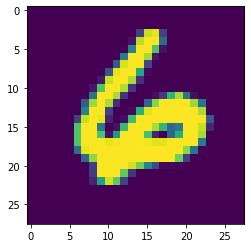

In [110]:
plt.imshow(X[5].view(28,28))
plt.show()

In [113]:
print((net(X[5].view(-1,784))))

tensor([[-1.6469e+01, -3.1118e+01, -1.8864e+01, -2.3428e+01, -1.8595e+01,
         -2.2365e+01, -1.1921e-07, -3.1429e+01, -2.0005e+01, -2.2436e+01]],
       grad_fn=<LogSoftmaxBackward>)


In [18]:
torch.save(net.state_dict(), 'Documents/digits_neural_network')

In [21]:
from skimage.transform import resize
from skimage.color import rgb2gray
import matplotlib.pyplot as plt
import numpy as np
import torch
import imageio

In [23]:
picture = imageio.imread("Documents/Digits_project/pygame_screenshot.jpeg")
picture = resize(picture, (28,28), mode='constant', anti_aliasing=True)
picture = rgb2gray(picture)

In [24]:
Tensor = torch.tensor(picture)
Tensor = Tensor.view(-1,784).float()

In [25]:
torch.argmax(net(Tensor))

tensor(6, grad_fn=<NotImplemented>)